### Variables del Dataset
- **Date:** La fecha de la observación.

- **Location:** El nombre de la estación meteorológica.

- **MinTemp:** La temperatura mínima en grados centígrados.

- **MaxTemp:** La temperatura máxima en grados centígrados.

- **Rainfall:** La cantidad de lluvia registrada para el día en mm.

- **Evaporation:** La cantidad de agua evaporada en mm para el día.

- **Sunshine:** El número de horas de sol en el día.

- **WindGustDir:** La dirección de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.

- **WindGustSpeed:** La velocidad (km/h) de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.

- **WindDir9am:** Dirección del viento a las 9am.

- **WindDir3pm:** Dirección del viento a las 3pm.

- **WindSpeed9am:** Velocidad del viento (km/h) a las 9 a.m.

- **WindSpeed3pm:** Velocidad del viento (km/h) a las 3 p.m.

- **Humidity9am:** Humedad relativa a las 9am.

- **Humidity3pm:** Humedad relativa a las 3pm.

- **Pressure9am:** Presión atmosférica (hpa) a las 9 a.m.

- **Pressure3pm:** Presión atmosférica (hpa) a las 3 p.m.

- **Cloud9am:** Fracción del cielo oscurecida por las nubes (en "octavos") a las 9 a.m.

- **Cloud3pm:** Fracción del cielo oscurecida por las nubes (en "octavos") a las 3 p.m.

- **Temp9am:** Temperatura (°C) a las 9am.

- **Temp3pm:** Temperatura (°C) a las 3pm.

- **RainToday:** Booleano: 1 si hubo precipitaciones en las últimas 24 horas, de lo contrario 0.

- **RainTomorrow:** La variable objetivo a predecir. ¿Llovió al día siguiente? Sí o no.

### Datos Externos

**Shapefiles - NRM Clusters:**
https://www.climatechangeinaustralia.gov.au/en/overview/methodology/nrm-regions/

Para poder realizar el primer punto del trabajo práctico, investigamos principalmente si ya había un GeoJSON o Shapefile que delimitara las regiones de Australia teniendo en cuenta sus condiciones clímaticas y llegamos a este recurso.

Los Clusters NRM vienen a solventar este faltante, dándonos tres alternativas para segmentar nuestras regiones. Estas divisiones estan pensadas para analizar el cambio climático y sus efectos, teniendo en cuenta las características físicas del territorio.

La segmentación que nos ofrece es mediante Multipolígonos, en cuatro super clusters, ocho clusters y dieciseis sub-clusters. Esto nos permitirá utilizar funciones de Geopandas para mapear nuestras estaciones meteorológicas a la región correspondiente mediante un Spatial Join.

Decidimos utilizarlo ya que debemos segmentar el territorio basándose en patrones climáticos y consideramos que una fuente fiable y validada sería ideal para nuestro análisis.

El único faltante observado es la Norfolk Island, que es considerada territorio externo (u 'Offshore') de Australia y será tratado como una región aislada con sus propias características que no se corresponden con las del territorio interno (o 'Inland').

### Importación de Módulos y Lectura de CSV

Fuente - Clusters : https://www.climatechangeinaustralia.gov.au/en/overview/methodology/nrm-regions

In [34]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium

import seaborn as sns
import random
import os
import pickle

from shapely import wkt
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score, classification_report, ConfusionMatrixDisplay
from scipy.stats import chi2_contingency

import warnings
warnings.filterwarnings('ignore')


In [35]:
df = pd.read_csv('weatherAUS.csv')
df_pycaret = df.copy()

In [36]:
regiones_8 = gpd.read_file('.\\Shapefiles\\NRM_clusters.shp')

### Funciones Utiles

In [37]:
def detectar_outliers_RIC(df, columna):
    Q1 = df[columna].quantile(0.25)
    Q3 = df[columna].quantile(0.75)
    RIC = Q3 - Q1
    limite_inferior = Q1 - 1.5 * RIC
    limite_superior = Q3 + 1.5 * RIC

    outliers = df[(df[columna] < limite_inferior) | (df[columna] > limite_superior)]

    return outliers, limite_inferior, limite_superior

In [38]:
def imputador_numerico(df: pd.DataFrame, variable_a_imputar:str):
    '''
    Función de imputación por región y mes.
    En caso de no tener valores para poder realizar el cálculo de la mediana, se imputa con la mediana global

    Argumentos necesarios:
    df - Dataframe donde se realizará la imputación
    variable_a_imputar - Identificador de la columna numérica a imputar

    Retorna:
    df - Dataframe original con la variable numérica imputada
    '''

    lookup_medianas = df.groupby(['label', 'Mes'])[variable_a_imputar].median()
    mediana_global = df[variable_a_imputar].median()
    medianas_transform = df.groupby(['label', 'Mes'])[variable_a_imputar].transform('median')
    variable_imputada = f'{variable_a_imputar}_imputada'
    df[variable_imputada] = df[variable_a_imputar].fillna(medianas_transform)
    df[variable_imputada] = df[variable_imputada].fillna(mediana_global)
    carpeta_destino = 'imputadores'
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)
        print(f"Carpeta creada: {carpeta_destino}")
    nombre_archivo = f"mediana_{variable_a_imputar}.pkl"
    ruta_completa = os.path.join(carpeta_destino, nombre_archivo)
    datos_a_guardar = {
        'lookup': lookup_medianas,
        'global': mediana_global
    }
    with open(ruta_completa, 'wb') as f:
        pickle.dump(datos_a_guardar, f) 
    return df

In [39]:
def aplicar_imputacion_numerica_guardada(df_nuevo: pd.DataFrame, variable_a_imputar: str):
    '''
    Busca el archivo en 'imputadores/mediana_{variable}.pkl'
    y lo usa para imputar el dataframe nuevo.
    '''
    carpeta_origen = 'imputadores'
    nombre_archivo = f"mediana_{variable_a_imputar}.pkl"
    ruta_completa = os.path.join(carpeta_origen, nombre_archivo)
    
    with open(ruta_completa, 'rb') as f:
        datos_cargados = pickle.load(f)
            
    lookup_medianas = datos_cargados['lookup']
    mediana_global = datos_cargados['global']
    variable_imputada = f'{variable_a_imputar}_imputada'

    def obtener_mediana(row):
        try:
            valor = lookup_medianas.loc[row['label'], row['Mes']]
            if not pd.isna(valor):
                return valor
        except KeyError:
            pass
        return mediana_global

    if variable_imputada not in df_nuevo.columns:
        df_nuevo[variable_imputada] = df_nuevo[variable_a_imputar].copy()
    
    valores_faltantes = df_nuevo[variable_imputada].isna()
    
    if valores_faltantes.any():
        valores_relleno = df_nuevo[valores_faltantes].apply(obtener_mediana, axis=1)
        df_nuevo.loc[valores_faltantes, variable_imputada] = valores_relleno
    
    df_nuevo[variable_imputada] = df_nuevo[variable_imputada].fillna(mediana_global)
    
    return df_nuevo

In [40]:
def graficar_imputacion_por_grupo(df, variable_original, variable_imputada = '', columna_grupo= 'label', columna_x = 'Mes', ncols=3):
    """
    Genera una grilla de subplots para visualizar una variable original y su versión imputada.

    Argumentos necesarios:
    df - El dataframe a utilizar para graficar
    variable_original - Identificador de la columna original
    columna_grupo - Identificador de la columna por la cual se agruparán los datos
    columna_x - Identificador de la columna que representa el eje x
    ncols - Numero de columnas para realizar la grilla
    """
    grupos = df[columna_grupo].unique()
    n_grupos = len(grupos)
    nrows = int(np.ceil(n_grupos / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows), sharey=True, sharex=True)
    axes_flat = axes.flatten()

    for i, grupo_val in enumerate(grupos):
        ax = axes_flat[i]
        df_grupo = df[df[columna_grupo] == grupo_val]
        min_val = df_grupo[variable_original].dropna().min()
        max_val = df_grupo[variable_original].dropna().max()
        sns.lineplot(data=df_grupo, x=columna_x, y=variable_original, ax=ax,
                     errorbar=None, label='Datos Originales', color='cornflowerblue', linewidth=2.5)
        variable_imputada = f'{variable_original}_imputada'
        sns.lineplot(data=df_grupo, x=columna_x, y=variable_imputada, ax=ax,
                     errorbar=None, label='Datos Imputados', color='red', linestyle='--')

        ax.set_title(f'{grupo_val}')
        ax.grid(True, linestyle='--', alpha=0.6)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticks(range(1, 13))
        ax.legend()

    for i in range(n_grupos, len(axes_flat)):
        axes_flat[i].set_visible(False)

    fig.supxlabel(columna_x, fontsize=16)
    fig.supylabel(variable_original, fontsize=16)
    fig.suptitle(f'Evolución de {variable_original}: Original vs. Imputada', fontsize=20)
    plt.tight_layout(rect=[0.03, 0.03, 1, 0.95]) #type: ignore
    plt.show()


In [41]:
temporadas = {
    12: 'Verano', 1: 'Verano', 2: 'Verano',
    3: 'Otoño', 4: 'Otoño', 5: 'Otoño',
    6: 'Invierno', 7: 'Invierno', 8: 'Invierno',
    9: 'Primavera', 10: 'Primavera', 11: 'Primavera'
}

In [42]:
col_num = df.select_dtypes(include=np.number).columns.to_list()

In [43]:
def imputador_categorico_ponderado(df: pd.DataFrame, variable_a_imputar: str):
    '''
    Función de imputación aleatoria ponderada para variables categóricas.
    Crea una nueva columna con la imputación y mantiene la columna original.

    Argumentos necesarios:
    df - Dataframe a imputar
    variable_a_imputar - Identificador de la columna categórica a imputar

    Retorna:
    df - Dataframe original con la variable categórica imputada

    '''
    np.random.seed(13)
    valores_existentes = df[variable_a_imputar].dropna()
    frecuencias = valores_existentes.value_counts(normalize=True)
    variable_imputada = f'{variable_a_imputar}_imputada'
    df[variable_imputada] = df[variable_a_imputar].copy()
    filas_a_imputar = df[variable_imputada].isnull()
    num_nulos = filas_a_imputar.sum()
    if num_nulos > 0:
        valores_imputados = np.random.choice(
            a = frecuencias.index,
            size = num_nulos,
            p = frecuencias.values
        )
        df.loc[filas_a_imputar, variable_imputada] = valores_imputados
    
    carpeta_destino = 'imputadores'
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)
        print(f"Carpeta creada: {carpeta_destino}")
        
    nombre_archivo = f"frecuencia_{variable_a_imputar}.pkl"
    ruta_completa = os.path.join(carpeta_destino, nombre_archivo)
    with open(ruta_completa, 'wb') as f:
        pickle.dump(frecuencias, f)

    return df

In [44]:
def imputador_categorico_produccion(df, variable_a_imputar):
    
    np.random.seed(13)
    carpeta_origen = 'imputadores'
    nombre_archivo = f"frecuencia_{variable_a_imputar}.pkl"
    ruta_completa = os.path.join(carpeta_origen, nombre_archivo)
    with open(ruta_completa, 'rb') as f:
        frecuencias = pickle.load(f)

    variable_imputada = f'{variable_a_imputar}_imputada'
    if variable_imputada not in df.columns:
        df[variable_imputada] = df[variable_a_imputar].copy()
    
    filas_a_imputar = df[variable_imputada].isnull()
    num_nulos = filas_a_imputar.sum()
    if num_nulos > 0:
        valores_imputados = np.random.choice(
            a=frecuencias.index,
            size=num_nulos,
            p=frecuencias.values
        )
        df.loc[filas_a_imputar, variable_imputada] = valores_imputados
    
    return df

In [45]:
def graficar_distribucion_imputada_categorica(df: pd.DataFrame, variable_original: str):
    """
    Crea un gráfico de barras frecuencial comparando la distribución de una variable
    original y su versión imputada.
    """
    variable_imputada = f'{variable_original}_imputada'

    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    original_counts = df[variable_original].value_counts()
    sns.barplot(x=original_counts.index, y=original_counts.values, ax=ax[0], palette='inferno', legend=False)
    ax[0].set_title(f'Distribución Original de {variable_original}')
    ax[0].set_xlabel('Categorías')
    ax[0].set_ylabel('Frecuencia')
    ax[0].tick_params(axis='x', rotation=90)

    imputed_counts = df[variable_imputada].value_counts()
    sns.barplot(x=imputed_counts.index, y=imputed_counts.values, ax=ax[1], palette='inferno', legend=False)
    ax[1].set_title(f'Distribución Imputada de {variable_original}')
    ax[1].set_xlabel('Categorías')
    ax[1].set_ylabel('Frecuencia')
    ax[1].tick_params(axis='x', rotation=90)

    plt.suptitle(f'Comparación de Distribuciones para "{variable_original}"', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) #type: ignore
    plt.show()

In [46]:
def codificador_ciclico(df: pd.DataFrame, variable_a_codificar: str, categorias_ordenadas: list):
    """
    Realiza una codificación cíclica en una columna categórica ordenada.

    Argumentos necesarios:
    df - Dataframe donde se realizará la codificación
    variable_a_codificar - Identificador de la columna categórica a codificar cíclicamente
    categorías_ordenadas - Lista de categorías ordenada de manera que reflejen el orden cíclico
      ej: Meses - [1,2... 12] - El mes 12 precede al mes 1.

    Retorna:
    df- Dataframe con la columna codificada de manera cíclica, elimina la columna original
    """
    if variable_a_codificar not in df.columns:
        return df

    mapeo = {categoria: i for i, categoria in enumerate(categorias_ordenadas)}
    max_val = len(categorias_ordenadas)

    columna_mapeada = df[variable_a_codificar].map(mapeo)

    df[f'{variable_a_codificar}_sin'] = np.sin(2 * np.pi * columna_mapeada / max_val)
    df[f'{variable_a_codificar}_cos'] = np.cos(2 * np.pi * columna_mapeada / max_val)

    df.drop(columns=[variable_a_codificar], inplace=True)
    return df

In [47]:
def crear_modelo_optuna(best_params, epochs=100):
    """
    Transforma los parámetros de Optuna al formato que pide RedLluviaPipeline.
    """

    capas_ordenadas = []
    keys_capas = [k for k in best_params.keys() if k.startswith('n_units_layer_')]
    keys_capas.sort()

    for key in keys_capas:
        capas_ordenadas.append(best_params[key])
    return RedLluviaPipeline(
        learning_rate = best_params['learning_rate'],
        dropout_rate = best_params['dropout_rate'],
        batch_size = best_params['batch_size'],
        epochs = epochs,
        capas_ocultas = capas_ordenadas,
        random_state=42
    )

### EDA

In [48]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [49]:
indices_drop = df[df['RainTomorrow'].isna()].index
df = df.drop(indices_drop)

In [50]:
#Convertimos el campo Date a tipo Datetime para poder utilizar sus funciones internas
df['Date'] = pd.to_datetime(df['Date'])
df['Mes'] = df['Date'].dt.month #type: ignore
df['Temporada'] = df['Mes'].apply(lambda x: temporadas[x])

In [51]:
print(f'Dataframe shape: {df.shape}\n')
print(f'\n{df.isna().sum()}')
print(f'\n{df.describe()}')

Dataframe shape: (142193, 25)


Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RainTomorrow         0
Mes                  0
Temporada            0
dtype: int64

                                Date        MinTemp        MaxTemp  \
count                         142193  141556.000000  141871.000000   
mean   2013-04-01 00:28:51.730816512      12.186400      23.226784   
min              2007-11-01 00:00:00      -8.500000      -4.800000   
25%              2011-01-06 00:00:00       7.600000      17.900000   
50%              2013-05-27 0

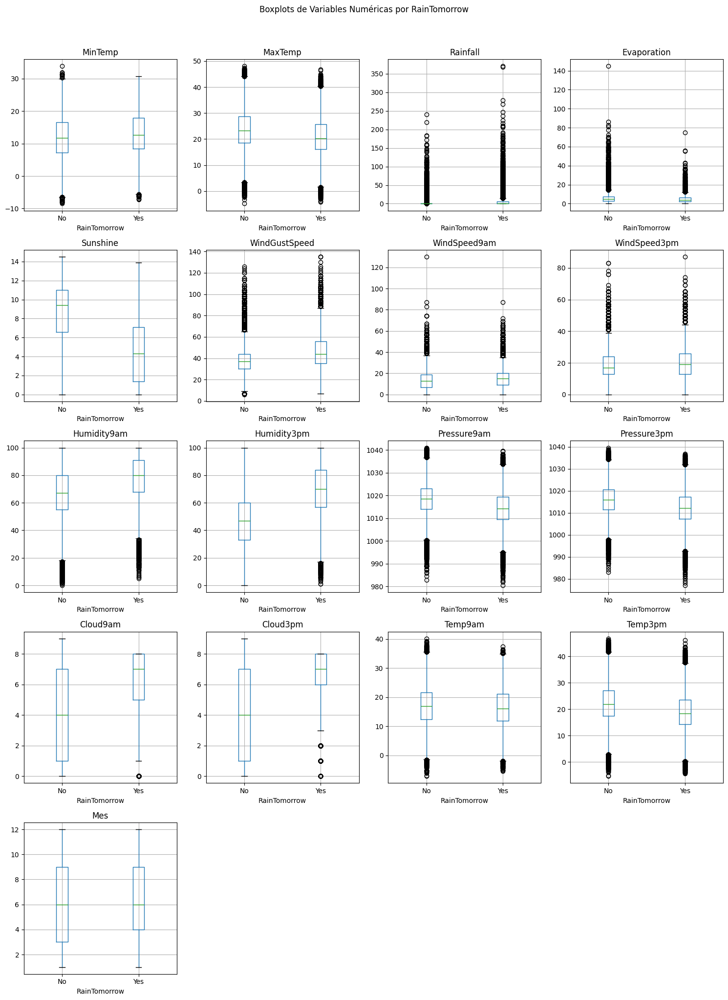

In [52]:
numericas = df.select_dtypes(include = np.number).columns.tolist()
columnas = 4
filas = (len(numericas) + columnas - 1) // columnas
fig, axes = plt.subplots(filas, columnas, figsize = (15, filas * 4))
axes = axes.flatten()

for i, col in enumerate(numericas):
    df.boxplot(column = col, by = 'RainTomorrow', ax = axes[i]) 
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('RainTomorrow')
    fig.suptitle('Boxplots de Variables Numéricas por RainTomorrow', y=1.02)
    
for i in range(len(numericas), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

<Axes: >

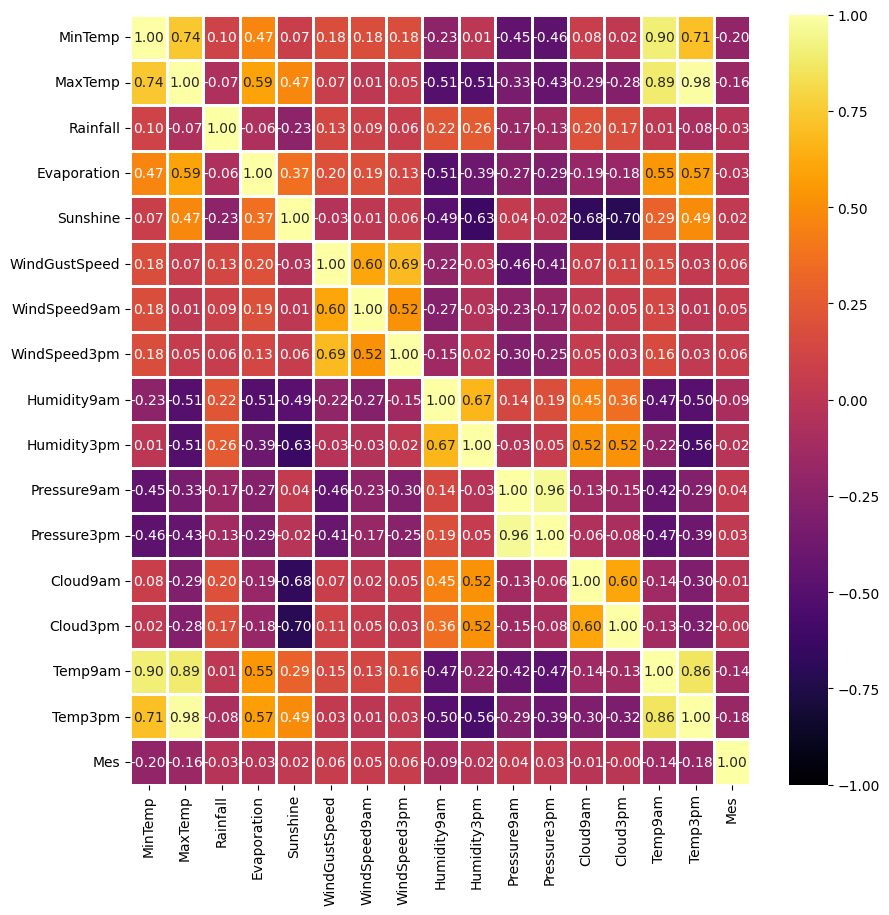

In [53]:
plt.figure(figsize=(10, 10))
sns.heatmap(data=df.select_dtypes(include=np.number).corr(), vmin=-1, vmax=1, cmap='inferno', annot=True, linewidths=1,fmt='.2f')

La matriz de correlación nos permite observar que:


*   Entre las variables  'MinTemp' y 'MaxTemp', 'MinTemp' y 'Temp9am', 'MinTemp' y 'Temp3pm', 'MaxTemp' y 'Temp9am', 'MaxTemp' y 'Temp3pm', 'Pressure9am' y 'Pressure3pm', 'Temp9am' y 'Temp3pm' existen relación lineales, positivas, fuertes.
*   Las variables 'MinTemp' y 'Evaporation', 'MaxTemp' y 'Evaporation', 'MaxTemp' y 'Sunshine', 'MaxTemp' y 'Humidity9am', 'MaxTemp' y 'Humidity3pm', 'Evaporation' y 'Humidity9am', 'Sunshine' y 'Humidity9am', 'Sunshine' y 'Humidity3pm', 'Sunshine' y 'Cloud9am', 'Humidity9am' y 'Pressure9am', 'Humidity9am' y 'Cloud9am', 'Humidity3pm' y 'Temp3pm', 'Humidity3pm' y 'Cloud3pm', 'Pressure9am' y 'Temp9am', 'Pressure3pm' y 'Temp9am', 'Pressure3pm' y 'Temp3pm', 'Cloud9am' y 'Cloud3pm' presentan una relación lineal, positiva, moderada.

*   Las variables 'Cloud3pm' y 'Sunshine' presentan una correlación, negativa, fuerte.
*   Las variables 'MaxTemp' y 'Humidity3pm', 'Sunshine' y 'Humidity9am', 'Sunshine' y 'Humidity3pm', 'Sunshine' y 'Cloud9am', 'Sunshine' y 'Cloud3pm', 'Humidity3pm' y 'Temp3pm', 'Cloud3pm' y 'Temp3pm' presentan una correlación, negativa, moderada.


Las demás variables presentan correlaciones lineales débiles o nulas.

Obtuvimos las coordenadas geográficas para representar cada estación meteorológica, y poder así asociarlas con los clusters o regiones.

In [54]:
#Este diccionario contiene como clave el nombre de la estación meteorológica y como valor, un punto que corresponde al formato WKT
#esto nos permite usar geopandas para realizar un spatial join y poder matchear regiones con estaciones.
stations_points = {
    "Albury": "POINT(146.91583 -36.08056)",
    "BadgerysCreek": "POINT(150.75222 -33.87972)",
    "Cobar": "POINT(145.83194 -31.49972)",
    "CoffsHarbour": "POINT(153.11889 -30.30222)",
    "Moree": "POINT(149.83389 -29.46583)",
    "Newcastle": "POINT(151.75000 -32.91700)",
    "NorahHead": "POINT(151.57417 -33.28250)",
    "NorfolkIsland": "POINT(167.951564 -29.033794 )",
    "Penrith": "POINT(150.69450 -33.75150)",
    "Richmond": "POINT(150.78400 -33.58600)",
    "Sydney": "POINT(151.21000 -33.86778)",
    "SydneyAirport": "POINT(151.17722 -33.94611)",
    "WaggaWagga": "POINT(147.35900 -35.10900)",
    "Williamtown": "POINT(151.83444 -32.79500)",
    "Wollongong": "POINT(150.88300 -34.41700)",
    "Canberra": "POINT(149.12694 -35.29306)",
    "Tuggeranong": "POINT(149.08600 -35.40900)",
    "MountGinini": "POINT(148.95000 -35.47000)",
    "Ballarat": "POINT(143.85000 -37.55000)",
    "Bendigo": "POINT(144.28278 -36.75917)",
    "Sale": "POINT(147.05400 -38.10340)",
    "MelbourneAirport": "POINT(144.84479 -37.66371)",
    "Melbourne": "POINT(144.96306 -37.81361)",
    "Mildura": "POINT(142.15833 -34.18889)",
    "Nhil": "POINT(141.64722 -36.31083)",
    "Portland": "POINT(141.47111 -38.31806)",
    "Watsonia": "POINT(145.08300 -37.70800)",
    "Dartmoor": "POINT(141.28333 -37.93333)",
    "Brisbane": "POINT(153.02806 -27.46778)",
    "Cairns": "POINT(145.77330 -16.92330)",
    "GoldCoast": "POINT(153.40000 -28.01667)",
    "Townsville": "POINT(146.81580 -19.26220)",
    "Adelaide": "POINT(138.60072 -34.92866)",
    "MountGambier": "POINT(140.63444 -37.81028)",
    "Nuriootpa": "POINT(138.86500 -34.50100)",
    "Woomera": "POINT(136.81694 -31.14417)",
    "Albany": "POINT(117.88139 -35.02278)",
    "Witchcliffe": "POINT(115.09900 -34.02400)",
    "PearceRAAF": "POINT(116.01500 -31.66700)",
    "PerthAirport": "POINT(115.96700 -31.94030)",
    "Perth": "POINT(115.86000 -31.95000)",
    "SalmonGums": "POINT(121.64500 -32.98000)",
    "Walpole": "POINT(116.72300 -34.93100)",
    "Hobart": "POINT(147.32500 -42.88055)",
    "Launceston": "POINT(147.30440 -41.36050)",
    "AliceSprings": "POINT(133.87000 -23.70000)",
    "Darwin": "POINT(130.84111 -12.43806)",
    "Katherine": "POINT(132.26667 -14.46667)",
    "Uluru": "POINT(131.03611 -25.34500)"
}

In [55]:
#Mapeo de coordenadas por Location
df['gpd_coordenadas'] = df['Location'].map(lambda x: stations_points[x])

In [56]:
#Conversión de coordenadas a WKT
df['gpd_coordenadas'] = df['gpd_coordenadas'].apply(wkt.loads) #type: ignore

In [57]:
#Creación del geodataframe utilizando el CRS EPSG:4326
clima_gdf = gpd.GeoDataFrame(df, geometry='gpd_coordenadas', crs="EPSG:4326")

In [58]:
#Spatial join para poder etiquetar cada estación con la región en la que está contenida
regiones_8 = regiones_8.to_crs(clima_gdf.crs) #type: ignore
estaciones_regiones = gpd.sjoin(clima_gdf, regiones_8, how='left', predicate='within')
estaciones_regiones = estaciones_regiones.drop(columns=['index_right', 'OBJECTID', 'Shape_Leng', 'Shape_Area', 'code'], axis=0)
estaciones_regiones.loc[estaciones_regiones['Location'] == "NorfolkIsland", 'label'] = 'Offshore'

In [59]:
estaciones = estaciones_regiones.drop_duplicates(subset='Location', keep='first')
mapa_australia = folium.Map(location=[-25.27, 133.77], zoom_start=4, scrollWheelZoom=False)
folium.GeoJson(
    regiones_8,
    style_function=lambda feature: {
        'fillColor': 'lightblue',
        'color': 'blue',
        'weight': 1,
        'fillOpacity': 0.3,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['label'],
        aliases=['Región:'],
        sticky=True
    )
).add_to(mapa_australia)

for _, estacion in estaciones.iterrows():
    # Coordenadas de la estación
    latitud = estacion.gpd_coordenadas.y
    longitud = estacion.gpd_coordenadas.x
    nombre_region = estacion['label'] if pd.notna(estacion['label']) else "No Asignada"
    popup_info = f"""
    <b>Estación:</b> {estacion['Location']}<br>
    <b>Región:</b> {nombre_region}<br>
    """

    # Añadir un marcador de círculo al mapa
    folium.CircleMarker(
        location=[latitud, longitud],
        radius=5,
        color='red',
        fill=True,
        fill_color='darkred',
        fill_opacity=0.7,
        popup=folium.Popup(popup_info, max_width=200)
    ).add_to(mapa_australia)

In [60]:
mapa_australia

### Separación Train-Test

Realizamos la separación Train-Test, utilizando la funcion de estratificación de train_test_split para asegurarnos que nuestra variable target se distribuya de la misma manera tanto en Train como en Test. En caso de no utilizarlo, aunque muy improbable, puede que una de las clases no quede representada en el conjunto de Train, y por lo tanto, al entrenar el modelo, podría no llegar a funcionar correctamente ya que solo tendría un solo valor para predecir. En resumen, este método nos permite lidiar con el desbalanceo de las clases de la variable target.

In [61]:
X_train, X_test =train_test_split(estaciones_regiones, test_size=0.2, random_state=42, stratify=estaciones_regiones['RainTomorrow'])

In [62]:
y_train = X_train['RainTomorrow']
y_test = X_test['RainTomorrow']
X_train.drop(columns = ['RainTomorrow'], axis=0, inplace=True)
X_test.drop(columns = ['RainTomorrow'], axis=0, inplace=True)

Hacemos uso de nuestro imputador categórico ponderado que, internamente, utiliza el campo 'Location' correspondiente a la localidad donde está ubicada la estación meteorológica y el mes, para encontrar la tabla de frecuencias de cada uno de los dieciseis puntos cardenales.

Esta tabla de frecuencias, a su vez, se utiliza para calcular la probabilidad de todas las direcciones de viento, en dada estación y mes y a partir de esto, mediante un random choice, seleccionamos una de las dieciseis. Esto nos permite, en cierta forma, mantener la distribución de frecuencia y respetar la aleatoridad del fenómeno de manera granular sin introducir demasiado ruido.

La elección del campo 'Location' por sobre la región fue porque entendemos que la dirección del viento, si bien puede ser igual por sobre toda una región, es más bien un fenómeno local. Hay muchas más chances que la dirección del viento cambie según nos movamos por la región a que se mantenga constante.

In [129]:
for variable in ['WindDir9am', 'WindDir3pm', 'WindGustDir']:
  X_train = imputador_categorico_ponderado(X_train, variable)
  X_test = imputador_categorico_produccion(X_test,  variable)

In [63]:
X_train.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 113754 entries, 103642 to 122308
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   Date             113754 non-null  datetime64[ns]
 1   Location         113754 non-null  object        
 2   MinTemp          113241 non-null  float64       
 3   MaxTemp          113496 non-null  float64       
 4   Rainfall         112623 non-null  float64       
 5   Evaporation      65059 non-null   float64       
 6   Sunshine         59410 non-null   float64       
 7   WindGustDir      106269 non-null  object        
 8   WindGustSpeed    106314 non-null  float64       
 9   WindDir9am       105699 non-null  object        
 10  WindDir3pm       110688 non-null  object        
 11  WindSpeed9am     112672 non-null  float64       
 12  WindSpeed3pm     111624 non-null  float64       
 13  Humidity9am      112336 non-null  float64       
 14  Humidity3pm 

Podemos observar en nuestro dataframe original que las distribuciones de frecuencia generales no cambian, más bien, todos los puntos cardinales ven un incremento de frecuencia similar.

KeyError: 'WindDir9am_imputada'

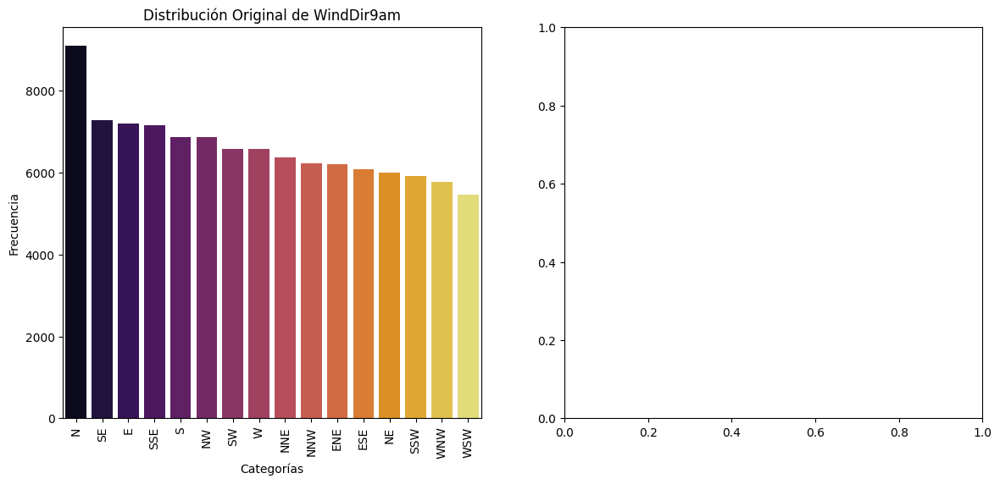

In [64]:
for variable in ['WindDir9am', 'WindDir3pm', 'WindGustDir']:
  graficar_distribucion_imputada_categorica(X_train,variable)

Una vez imputadas las variables categóricas, pasamos a las numéricas. Para ello definimos una función imputador numérico que nos permite calcular la mediana de nuestras variables numéricas, en función a la región y el mes. Ya que la mayoría de las variables numéricas se relacionan unas y otras con la estacionalidad, decidimos que  esta agrupación nos permitiría mantener un grado de granularidad suficiente para poder representar los fenómenos meteorológicos a nivel región. Podríamos haber utilizado la variable 'Location' pero, al hacerlo, podríamos enfrentarnos al hecho de no tener suficiente información de cada estación, mes a mes, para poder obtener un valor estadístico consistente y lo más acercado a la realidad posible. Hay muchas más chances de introducir ruido. Consideramos que este acercamiento es el más robusto teniendo en cuenta nuestras posibilidades.

In [65]:
for columna in col_num:
  X_train = imputador_numerico(X_train, columna)
  X_test = aplicar_imputacion_numerica_guardada(X_test, columna)


Carpeta creada: imputadores


A partir de nuestras imputaciones, definimos una función para graficar bastante sencilla, que nos deja visualizar como afectamos la distribución de las variables numéricas región a región.
Vamos a ejemplificar solamente dos de ellas y dejaremos a disposición la lista de variables numéricas para verificar el resto de las distribuciones ya que hemos observado, una a una, que la tendencia se mantiene a través de la mayoría de ellas salvo las explicitadas más adelante.

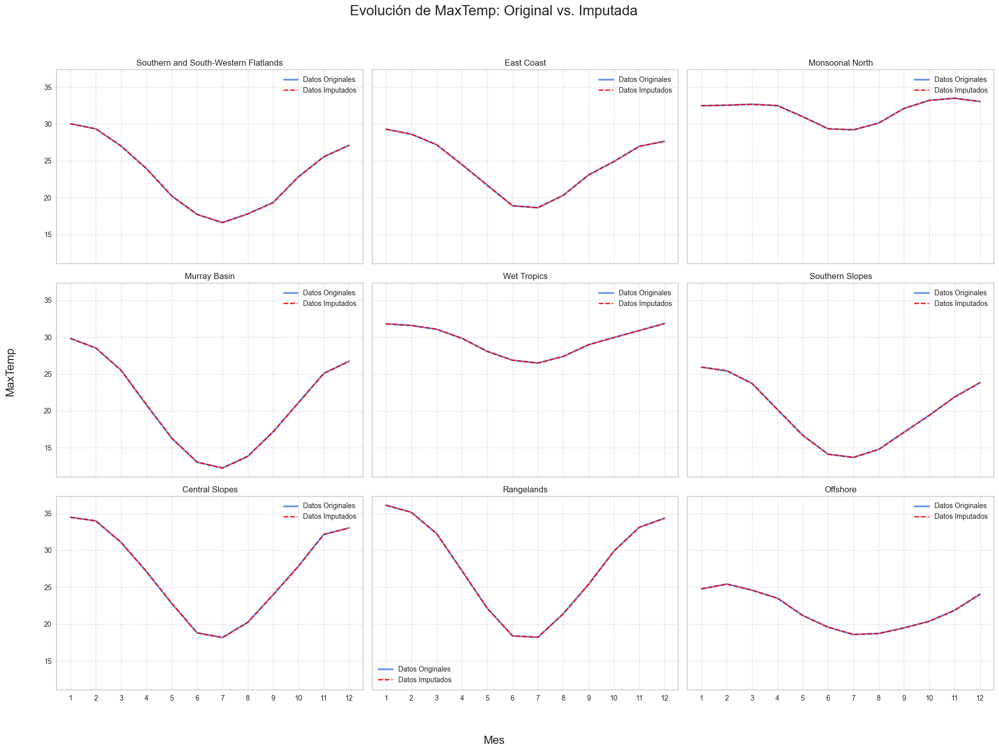

In [132]:
graficar_imputacion_por_grupo(X_train, 'MaxTemp')

En esta primera gráfica, los lineplots están utilizando la mediana de los datos obtenidos para graficar la tendencia mes a mes ya que fue el estadístico utilizado para la imputación. Podemos ver que en las nueve regiones ambos lineplots estan superpuestos, lo que nos indica que nuestra imputación no varió la distribución mes a mes de la variable de temperatura maxima.

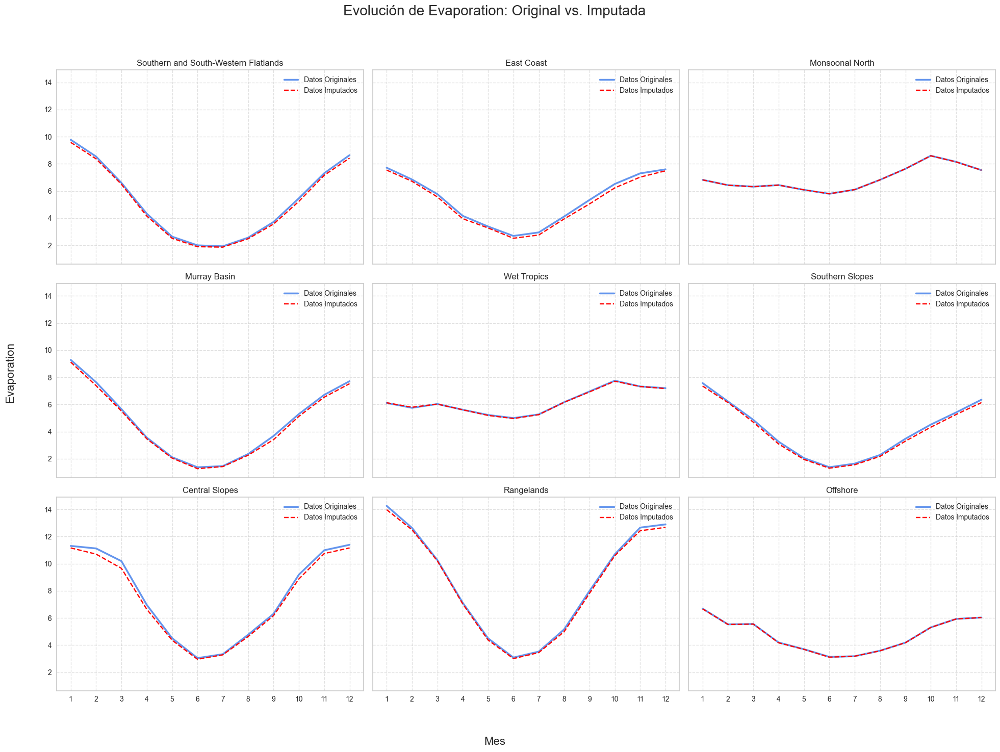

In [133]:
graficar_imputacion_por_grupo(X_train, 'Evaporation')

En esta segunda gráfica podemos observar que si hay una leve diferencia entre los valores imputados y los originales. Aunque las diferencias son mínimas, las distribuciones se mantienen prácticamente iguales. Nos sorprende que se comporte de esta manera ya que esta columna posee aproximadamente un 40% de datos faltantes.

In [134]:
X_train.groupby(['label', 'Mes'])['Evaporation'].apply(lambda x: x.isna().sum()).unstack(level='Mes')

Mes,1,2,3,4,5,6,7,8,9,10,11,12
label,,,,,,,,,,,,
Central Slopes,42,47,49,47,61,39,25,26,39,48,44,45
East Coast,1291,1047,1329,1162,1377,1328,1186,1219,1146,1207,1166,1071
Monsoonal North,22,32,36,9,6,20,1,3,3,9,18,19
Murray Basin,1042,893,1030,926,1102,1054,900,973,933,940,925,945
Offshore,9,9,5,24,30,32,6,9,8,10,9,13
Rangelands,201,136,179,170,191,194,157,154,148,149,142,154
Southern Slopes,785,620,782,693,843,806,677,746,699,748,697,698
Southern and South-Western Flatlands,995,793,1021,881,1001,925,847,841,818,865,839,774
Wet Tropics,35,33,35,30,35,34,15,10,22,14,7,10


Esto se puede deber justamente a la distribución de los datos faltantes ya que se distribuyen equitativamente mes a mes por región, con muy poca variación, permitiendonos imputar de manera más consistente. El resto de las variables numéricas se comportan de manera similar, respetando tanto la distribución como el sesgo original.

A continuación podremos observar las variables que no pueden ser imputadas con nuestro método, ya que varían su distribución, o introducen algún tipo de sesgo sistemático. Estas variables se corresponden con las que presentan 40% de faltantes de datos.

Como primer caso tenemos la variable 'Sunshine' que mantiene la distribución de la mediana de manera consistente, pero introduce sesgo al mostrar valores más elevados mes a mes. De cierta manera, nuestro imputador está introduciendo valores más altos que los valores que realmente faltaban.
Intuimos que nuestra agrupación puede no tener mucho sentido a la hora de explicar este fenómeno. Podríamos considerar una imputación utilizando la relación entre el resplandor y las nubes, ya que el sentido común indica que cuanto más esté cubierto el cielo por nubes, menor va a ser el resplandor. De hecho, esto se ve reforzado en nuestra matriz de correlación que nos muestra una correlación negativa fuerte de 0.7 aproximadamente entre Sunshine y ambas Cloud9am y 3pm, mientras que las antes mencionadas tienen una correlación positiva de 0.6.

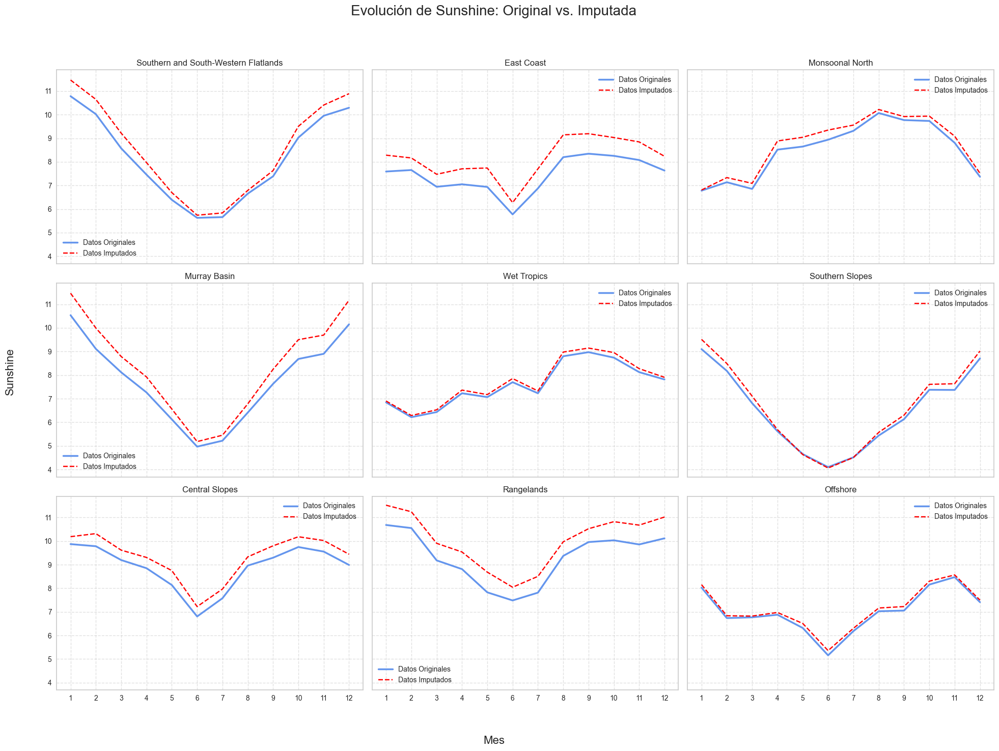

In [135]:
graficar_imputacion_por_grupo(X_train, 'Sunshine')

En los siguientes casos de los campos Cloud3pm y Cloud9am, podemos observar lo contrario. No se respeta la distribución y estamos introduciendo sesgo para varios meses en cada región. Nuevamente, si pudiesemos imputar el valor de cobertura del cielo por nubes utilizando el resplandor, tal vez podríamos llegar a una relación que represente mejor los datos originales.

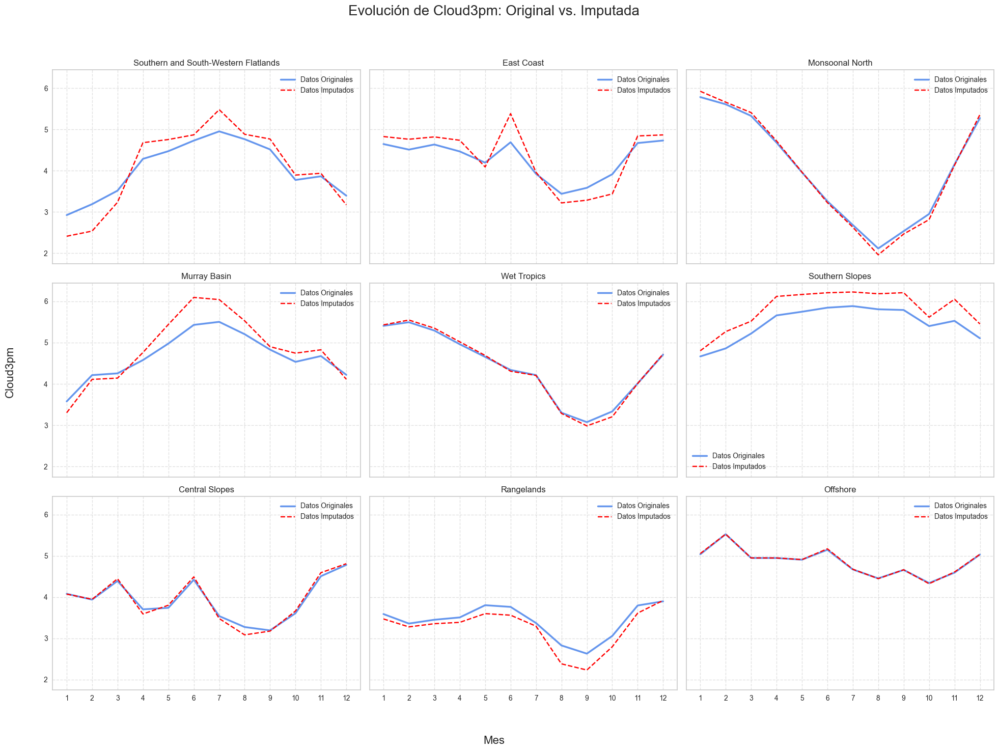

In [136]:
graficar_imputacion_por_grupo(X_train, 'Cloud3pm')

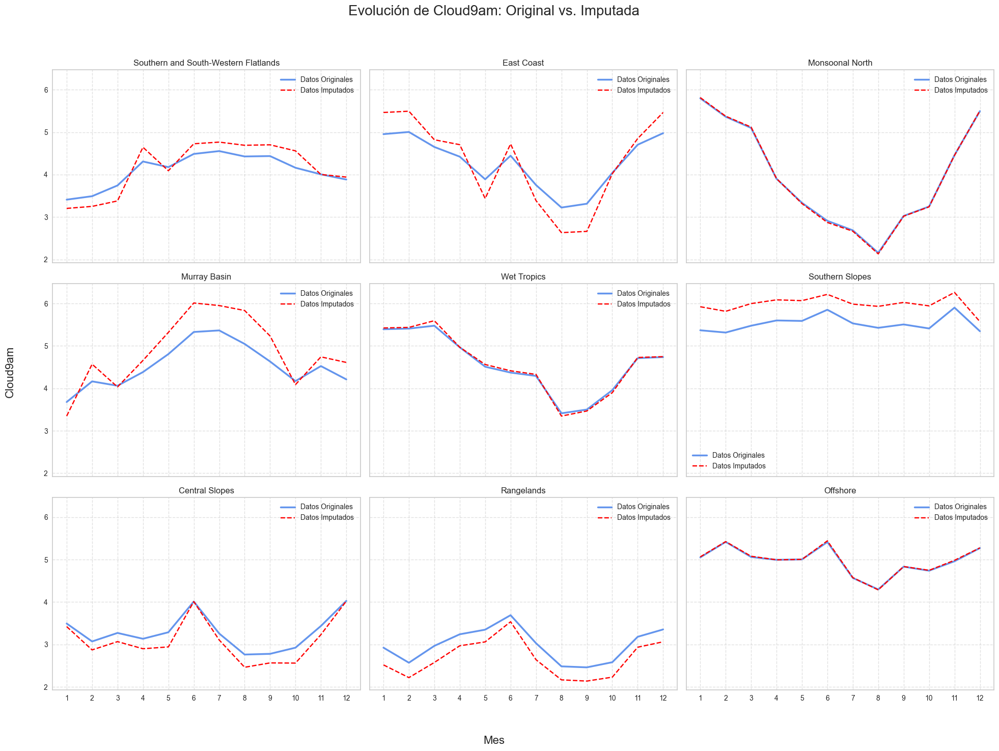

In [137]:
graficar_imputacion_por_grupo(X_train, 'Cloud9am')

Debido a que tenemos un gran grado de datos faltantes para estas tres columnas, decidimos no hacer un modelo de regresión lineal para, por ejemplo, imputar el resplandor en relación a las nubes, ya que los mismos faltantes de datos requerirían que rellenaramos las tres al mismo tiempo mientras vamos observando el dataframe con datos faltantes.
Es por eso que estas tres columnas son candidatas a ser eliminadas.

A continuación les dejamos los identificadores de las columnas numéricas por si desean explorar el resto de las distribuciones una a una.

In [138]:
for i, col in enumerate(col_num):
  if i % 3 == 0:
    print('\n')
  print(f'{col} \t',end='')



MinTemp 	MaxTemp 	Rainfall 	

Evaporation 	Sunshine 	WindGustSpeed 	

WindSpeed9am 	WindSpeed3pm 	Humidity9am 	

Humidity3pm 	Pressure9am 	Pressure3pm 	

Cloud9am 	Cloud3pm 	Temp9am 	

Temp3pm 	

In [139]:
#graficar_distribucion_imputada_categorica(X_train, 'nombre_de_la_variable')

In [140]:
#Descomentar para graficar todas las distribuciones:

#for col in col_num:
#  graficar_distribucion_imputada_categorica(X_train,col)

##### Codificación

Como la columna 'RainToday' es una columna binaria, se codifica como tal, utilizando 1 para 'Yes' y 0 para 'No'. Decidimos imputar los faltantes teniendo en cuenta el criterio obtenido de la BOM (Bureau of Meteorology). Si llueve más de un milímetro, es considerado lluvia.

In [141]:
X_train['RainToday'] = X_train['RainToday'].map({'Yes': 1, 'No': 0})
X_test['RainToday'] = X_test['RainToday'].map({'Yes': 1, 'No': 0})
y_test = y_test.map({'Yes': 1, 'No': 0})
y_train = y_train.map({'Yes': 1, 'No': 0})

In [142]:
condicion_lluvia_positiva = (X_train['RainToday'].isna()) & (X_train['Rainfall_imputada'] >= 1)
X_train.loc[condicion_lluvia_positiva, 'RainToday'] = 1
condicion_lluvia_negativa = (X_train['RainToday'].isna()) & (X_train['Rainfall_imputada'] < 1)
X_train.loc[condicion_lluvia_negativa, 'RainToday'] = 0

condicion_lluvia_positiva = (X_test['RainToday'].isna()) & (X_test['Rainfall_imputada'] >= 1)
X_test.loc[condicion_lluvia_positiva, 'RainToday'] = 1
condicion_lluvia_negativa = (X_test['RainToday'].isna()) & (X_test['Rainfall_imputada'] < 1)
X_test.loc[condicion_lluvia_negativa, 'RainToday'] = 0

Realizamos la codificación de las temporadas, si bien podríamos utilizar codificación cíclica, no es tan necesario ya que solamente obtendremos tres columnas resultantes de One-Hot Encoding

In [143]:
encoder = OneHotEncoder(sparse_output=False, drop='first')
train_temporadas = encoder.fit_transform(X_train[['Temporada']])
test_temporadas = encoder.transform(X_test[['Temporada']])

In [144]:
train_temporadas_df = pd.DataFrame(train_temporadas, columns=encoder.get_feature_names_out(['Temporada']))
test_temporadas_df = pd.DataFrame(test_temporadas, columns=encoder.get_feature_names_out(['Temporada']))

In [145]:
X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
X_train = pd.concat([X_train, train_temporadas_df], axis=1)
X_test = pd.concat([X_test, test_temporadas_df], axis=1)

A continuación realizamos el One-Hot Encoding de las regiones, tenemos nueve regiones distintas, por lo que obtendremos ocho columnas para poder representarlas.

In [146]:
ohe = OneHotEncoder(sparse_output = False, drop = 'first')
label_train_ohe = ohe.fit_transform(X_train[['label']])
label_test_ohe = ohe.transform(X_test[['label']])
labels = ohe.get_feature_names_out(['label'])
labels_train_df = pd.DataFrame(data = label_train_ohe, columns = labels)
labels_test_df = pd.DataFrame(data = label_test_ohe, columns = labels) #type: ignore

In [147]:
X_train = pd.concat([X_train, labels_train_df], axis = 1)
X_test = pd.concat([X_test, labels_test_df], axis = 1)

Teniendo en cuenta la naturaleza cíclica de los puntos cardinales, y para reducir la dimensionalidad resultante de realizar un One-Hot Encoding con dieciseis categorías diferentes, realizamos una codificación cíclica.

In [148]:
wind_directions = [
    'N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
    'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW'
]
for variable in ['WindDir9am_imputada', 'WindDir3pm_imputada', 'WindGustDir_imputada']:
  X_train = codificador_ciclico(X_train, variable , wind_directions)
  X_test = codificador_ciclico(X_test, variable, wind_directions)

Codificamos a los meses de la misma manera, por los mismos motivos mencionados anteriormente.

In [149]:
meses = np.arange(1, 13)
X_train = codificador_ciclico(X_train, 'Mes', meses) #type: ignore
X_test = codificador_ciclico(X_test, 'Mes', meses) #type: ignore

Ya que pudimos imputar las columnas, mostrar que nuestra imputación no modifica nuestras distribuciones, y delimitar nuestras variables candidatas a la eliminación, nos deshacemos de las variables originales e imputadas que ya no son de utilidad.

In [150]:
X_train = X_train.drop(columns=col_num, axis=0)
X_test = X_test.drop(columns=col_num, axis=0)

In [151]:
X_train = X_train.drop(columns = ['label'], axis = 0)
X_test = X_test.drop(columns = ['label'], axis = 0)

In [152]:
X_train = X_train.drop(columns = ['WindDir9am', 'WindDir3pm', 'WindGustDir'], axis = 0)
X_test = X_test.drop(columns = ['WindDir9am', 'WindDir3pm', 'WindGustDir'], axis = 0)

In [153]:
X_train = X_train.drop(columns=['gpd_coordenadas','Temporada','Date', 'Location'], axis=0)
X_test = X_test.drop(columns=['gpd_coordenadas','Temporada','Date', 'Location'], axis=0)

##### Normalización

Tomamos la decisión de utilizar el RobustScaler de sklearn ya que los valores atípicos observados para las variables numéricas parecen estar dentro de los rangos aceptables.

In [154]:
columnas_numericas_imputadas = ['MinTemp_imputada', 'MaxTemp_imputada',
       'Rainfall_imputada', 'Evaporation_imputada', 'Sunshine_imputada',
       'WindGustSpeed_imputada', 'WindSpeed9am_imputada',
       'WindSpeed3pm_imputada', 'Humidity9am_imputada', 'Humidity3pm_imputada',
       'Pressure9am_imputada', 'Pressure3pm_imputada', 'Cloud9am_imputada',
       'Cloud3pm_imputada', 'Temp9am_imputada', 'Temp3pm_imputada']

In [155]:
scaler = RobustScaler()
X_train[columnas_numericas_imputadas] = scaler.fit_transform(X_train[columnas_numericas_imputadas])
X_test[columnas_numericas_imputadas] = scaler.transform(X_test[columnas_numericas_imputadas])

In [156]:
preprocesadores = {
    'encoder': encoder,
    'ohe': ohe,
    'scaler': scaler
}
joblib.dump(preprocesadores, 'preprocesadores.pkl')

['preprocesadores.pkl']

### Implementación de Modelos

##### Regresión Logística - Usando pesos balanceados

Como primer acercamiento entrenamos un modelo de regresión logística, utilizando pesos balanceados teniendo en cuenta que tenemos una proporcion 1 a 8 en las clases target 'Yes' / 'No'

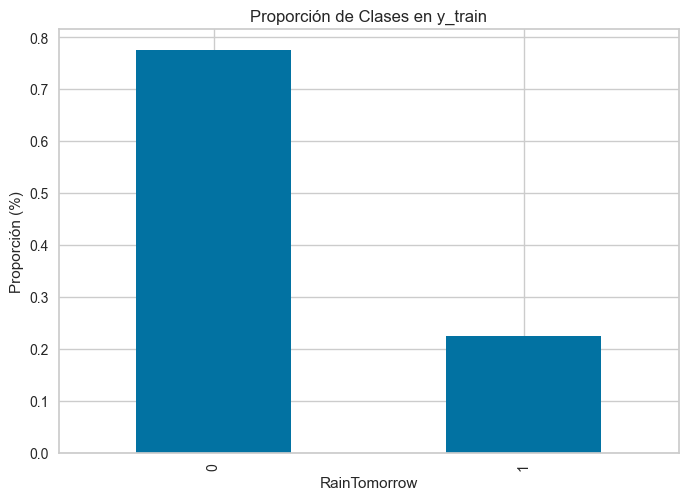

In [157]:
y_train_porc = y_train.value_counts()/len(y_train)
y_train_porc.plot(kind='bar', title='Proporción de Clases en y_train').set_ylabel('Proporción (%)');

In [158]:
modelo_logistic = LogisticRegression(random_state=13, class_weight='balanced')
modelo_logistic.fit(X_train, y_train)
y_train_predict = modelo_logistic.predict(X_train)

In [159]:
print("Métricas en Datos de Entrenamiento")
reporte_train_1 = classification_report(y_train, y_train_predict, output_dict = True)
df_reporte_train_1 = pd.DataFrame(reporte_train_1).transpose()
df_reporte_train_1.style.background_gradient(cmap = 'Blues').format("{:.2f}")

Métricas en Datos de Entrenamiento


,precision,recall,f1-score,support
0,0.92,0.79,0.85,88252.00
1,0.52,0.77,0.62,25502.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.72,0.78,0.74,113754.00
weighted avg,0.83,0.79,0.80,113754.00


In [160]:
y_test_predict = modelo_logistic.predict(X_test)

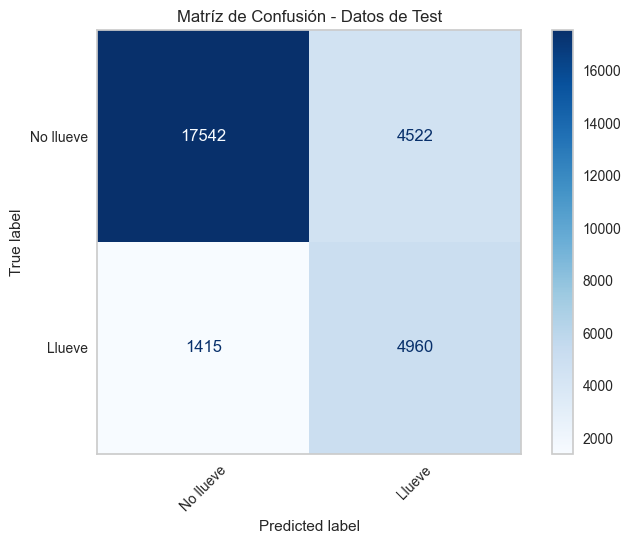

In [161]:
mat_test_1 =confusion_matrix(y_true = y_test, y_pred = y_test_predict)
ConfusionMatrixDisplay(mat_test_1, display_labels=['No llueve', 'Llueve']).plot(cmap=plt.cm.Blues, xticks_rotation=45) #type: ignore
plt.grid(False)
plt.title('Matríz de Confusión - Datos de Test');

Viendo la matriz de confusión, podemos observar que nuestro modelo está atribuyendole más valor a la clase 'Llueve' ya que tenemos una gran cantidad de falsos positivos (4523). Además no reconoce un 22% de los verdaderos positivos, lo que nos daría un 78% de Recall. Podemos observar también que el 50% de las predicciones (aproximadamente) para la clase 'Llueve' son Falsos Positivos. Esto nos indica que nuestro modelo está tratando de captar la mayor cantidad de casos posibles donde realmente llueva al día siguiente, lo que lo hace un buen predictor de lluvia.

In [162]:
print("Métricas en Datos de Test")
reporte_test_1 = classification_report(y_test, y_test_predict, output_dict = True)
df_reporte_test_1 = pd.DataFrame(reporte_test_1).transpose()
df_reporte_test_1.style.background_gradient(cmap = 'Blues').format("{:.2f}")

Métricas en Datos de Test


,precision,recall,f1-score,support
0,0.93,0.80,0.86,22064.00
1,0.52,0.78,0.63,6375.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.72,0.79,0.74,28439.00
weighted avg,0.84,0.79,0.80,28439.00


Teniendo en cuenta que nuestro problema apunta a predecir la lluvia en Australia al día siguiente, de nuestras métricas eligiríamos el Recall ya que consideramos que tener un Falso Negativo (precedir que no llueve, y que termine lloviendo) es más costoso que un Falso Positivo (predecir lluvia, y que no llueva). En nuestro caso, estamos capturando el 78% de los positivos reales.

In [163]:
#Vector de probabilidad de la clase positiva
y_pred_prob = modelo_logistic.predict_proba(X_test)[:, 1]
#Falsos positivos reales, Verdaderos positivos reales, umbrales
fpr_1, tpr_1, thresholds_1 = roc_curve(y_test, y_pred_prob)
roc_auc_1 = roc_auc_score(y_test, y_pred_prob)

#Calculamos la distancia euclideana elemento a elemento
distancia_1 = np.sqrt((1 - tpr_1)**2 + fpr_1**2)
#Seleccionamos el indice donde se encuentra la distancia mínima
indice_optimo_dist_1 = np.argmin(distancia_1)
#Ese mismo índice tiene el umbral óptimo en la lista de umbrales
umbral_optimo_dist_1 = thresholds_1[indice_optimo_dist_1]
fpr_optimo_1 = fpr_1[indice_optimo_dist_1]
tpr_optimo_1 = tpr_1[indice_optimo_dist_1]

Mediante el código anterior obtenemos el umbral optimo y los vectores necesarios para poder graficar la Curva ROC

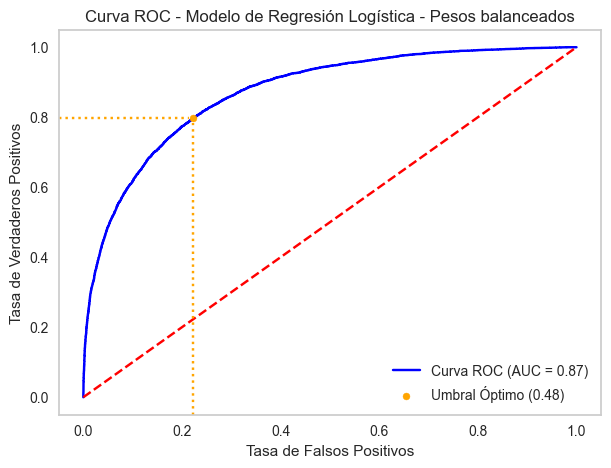

In [164]:
plt.figure(figsize=(7, 5))
plt.plot(fpr_1, tpr_1, color='blue', label=f'Curva ROC (AUC = {roc_auc_1:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.axvline(x=fpr_optimo_1, color='orange', linestyle=':', ymax=(tpr_optimo_1 / plt.ylim()[1]))
plt.axhline(y=tpr_optimo_1, color='orange', linestyle=':', xmax=(fpr_optimo_1 / plt.xlim()[1]+0.03))
plt.scatter(fpr_optimo_1, tpr_optimo_1, marker='o', color='orange', s=25, zorder=5,
            label=f'Umbral Óptimo ({umbral_optimo_dist_1:.2f})')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC - Modelo de Regresión Logística - Pesos balanceados')
plt.legend()
plt.grid()
plt.show()

Observamos que nuestro Umbral Óptimo es 0.50, esto se debe a que utilizamos class_weight="balanced" en el entrenamiento del modelo logístico, que asigna pesos proporcionales a la relación entre clases 1 a 8 antes mencionado.

El área bajo la curva es 0.87. Esto nos indica que si tomamos al azar un día que efectivamente llovió (TP) y otro al azar donde no llovió (TN) tenemos un 87% de probabilidad que le asigne una puntuación de lluvia más alta al día que efectivamente llovió.

##### Regresión Logística - Umbral óptimo

Decidimos explorar otro método para realizar nuestras predicciones, a partir del cálculo del umbral optimo de la Curva ROC a partir de un modelo de regresión logística base, para observar el umbral óptimo real.

In [165]:
modelo_logistico_umbral = LogisticRegression(random_state=13)
modelo_logistico_umbral.fit(X_train, y_train)
y_train_predict = modelo_logistico_umbral.predict(X_train)

In [166]:
#Vector de probabilidad de la clase positiva
y_pred_prob = modelo_logistico_umbral.predict_proba(X_test)[:, 1]
#Falsos positivos reales, Verdaderos positivos reales, umbrales
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = roc_auc_score(y_test, y_pred_prob)

#Calculamos la distancia euclideana elemento a elemento
distancia = np.sqrt((1 - tpr)**2 + fpr**2)
#Seleccionamos el indice donde se encuentra la distancia mínima
indice_optimo_dist = np.argmin(distancia)
#Ese mismo índice tiene el umbral óptimo en la lista de umbrales
umbral_optimo_dist = thresholds[indice_optimo_dist]
fpr_optimo = fpr[indice_optimo_dist]
tpr_optimo = tpr[indice_optimo_dist]

In [167]:
print(f'El úmbral óptimo es {umbral_optimo_dist:.2f} ')
print(f'Utilizando el umbral optimo, la proporción de Tasa de Falsos Positivos es {fpr_optimo:.2f}')
print(f'Utilizando el umbral optimo, la proporción de Tasa de Verdaderos Positivos es {tpr_optimo:.2f}')

El úmbral óptimo es 0.21 
Utilizando el umbral optimo, la proporción de Tasa de Falsos Positivos es 0.22
Utilizando el umbral optimo, la proporción de Tasa de Verdaderos Positivos es 0.79


Podemos observar que para un modelo de regresión logística base, el umbral óptimo es 0.21, mientras que para uno que realice un balance de pesos entre clases es 0.5. El umbral optimo, según lo trabajado, varía según el valor del hiperparámetro "class_weight" utilizado en el modelo de regresión.

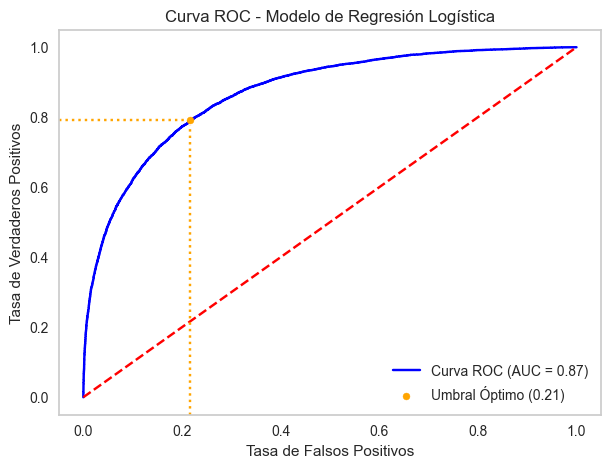

In [168]:
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, color='blue', label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.axvline(x=fpr_optimo, color='orange', linestyle=':', ymax=(tpr_optimo / plt.ylim()[1]))
plt.axhline(y=tpr_optimo, color='orange', linestyle=':', xmax=(fpr_optimo / plt.xlim()[1]+0.03))
plt.scatter(fpr_optimo, tpr_optimo, marker='o', color='orange', s=25, zorder=5,
            label=f'Umbral Óptimo ({umbral_optimo_dist:.2f})')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC - Modelo de Regresión Logística')
plt.legend()
plt.grid()
plt.show()

In [169]:
#Esta celda corresponde al umbralado según el umbral óptimo, debería utilizarse
#sore un modelo sin utilizar class_weight ya que este umbral nos permitirá balancear las predicciones
#de salida. Si lo usamos con class_weight = 'balanced' , es redundante.
probabilidades_positivas = modelo_logistico_umbral.predict_proba(X_test)[:, 1]
predicciones_finales = np.where(probabilidades_positivas > umbral_optimo_dist, 1, 0)


In [170]:
print("Métricas en Datos de Test - Umbralado")
reporte_umbralado_1 = classification_report(y_test, predicciones_finales, output_dict = True)
df_reporte_umbralado_1 = pd.DataFrame(reporte_umbralado_1).transpose()
df_reporte_umbralado_1.style.background_gradient(cmap = 'Blues').format("{:.2f}")


Métricas en Datos de Test - Umbralado


,precision,recall,f1-score,support
0,0.93,0.78,0.85,22064.00
1,0.51,0.79,0.62,6375.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.72,0.79,0.74,28439.00
weighted avg,0.84,0.78,0.80,28439.00


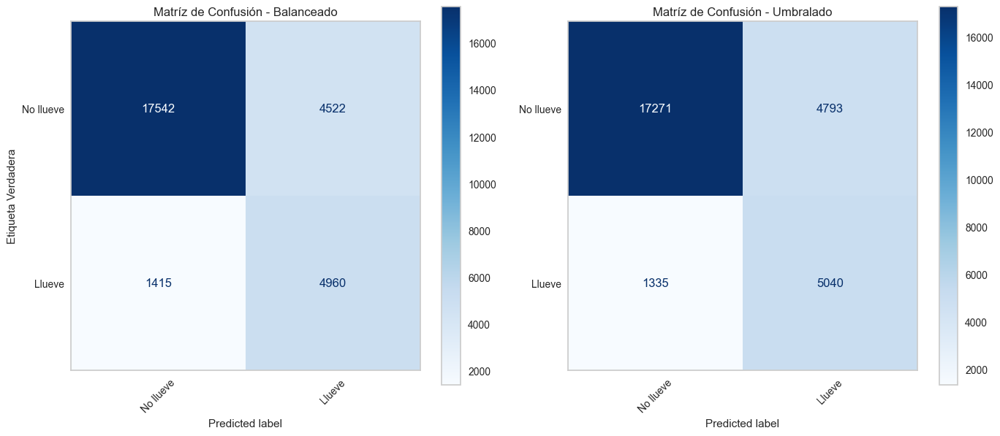

In [171]:
mat =confusion_matrix(y_true = y_test, y_pred = predicciones_finales)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6)) 
disp1 = ConfusionMatrixDisplay(mat_test_1, display_labels=['No llueve', 'Llueve'])
disp1.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax1) #type: ignore
ax1.grid(False)
ax1.set_title('Matríz de Confusión - Balanceado')
ax1.set_ylabel('Etiqueta Verdadera')
disp2 = ConfusionMatrixDisplay(mat, display_labels=['No llueve', 'Llueve'])
disp2.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax2) #type: ignore
ax2.grid(False)
ax2.set_title('Matríz de Confusión - Umbralado')
ax2.set_ylabel('')
ax2.tick_params(axis='y', labelleft=True)
plt.tight_layout()

Podemos observar que el desempeño del modelo umbralado es similar al modelo balanceado al observar las matrices de confusión. Notamos una leve mejora de Recall de la clase positiva en la matriz del umbralado ya que predice correctamente una mayor proporción de los verdaderos positivos. Observamos la misma tendencia a predecir 'Llueve' del modelo umbralado, viendo que también aumenta la cantidad de falsos positivos en comparación del modelo balanceado. 

### Implementación de un modelo base

El modelo base que pensamos implementar utiliza la columna 'RainToday' para predecir el valor de 'RainTomorrow'. Previo a esto, decidimos comprobar que existiese una relación significativa entre las variables. Ya que ambas variables son categóricas binarias, aprovechamos la función 'crosstab' de Pandas para poder observar la relación entre ambas.

In [ ]:
tabla_conteos = pd.crosstab(df['RainToday'], df['RainTomorrow'])

In [173]:
tabla_probabilidad = pd.crosstab(df['RainToday'], df['RainTomorrow'], normalize='index')
print(tabla_probabilidad)

RainTomorrow        No       Yes
RainToday                       
No            0.848132  0.151868
Yes           0.535940  0.464060


A partir de la tabla obtenida, podemos realizar la siguiente interpretación:


*   Si hoy no llovió se tiene un 15,18% de probabilidad de que llueva mañana.
*   Si hoy llovió se tiene un 46,4% de probabilidad de que llueva mañana.

Decidimos reforzar nuestra decisión planteando la prueba estadística de Chi cuadrado, si obtenemos un P-valor menor a 0.05, podemos decir que existe un grado de asociación estadísticamente significativo entre las variables intervinientes.

In [174]:
chi2, p_valor, _, _ = chi2_contingency(tabla_conteos)

print(f"Estadístico Chi-Cuadrado: {chi2}")
print(f"P-valor: {p_valor}")

Estadístico Chi-Cuadrado: 13799.479649324368
P-valor: 0.0


Se obtiene un p-value de 0. Esto confirma que existe un grado de asociación estadísticamente significativo entre las variables.


A partir de ello, extraemos la columna 'RainToday' de nuestro conjunto de Train que ahora será la predicción de nuestro modelo base, y la utilizamos para obtener las métricas asociadas.

In [175]:
y_pred_base = X_test['RainToday']

In [176]:
print("Métricas del modelo base")
reporte_base = classification_report(y_test, y_pred_base, output_dict = True)
df_reporte_base = pd.DataFrame(reporte_base).transpose()
df_reporte_base.style.background_gradient(cmap = 'Blues').format("{:.2f}")

Métricas del modelo base


,precision,recall,f1-score,support
0,0.84,0.85,0.85,22064.00
1,0.47,0.46,0.46,6375.00
accuracy,0.76,0.76,0.76,0.76
macro avg,0.66,0.65,0.65,28439.00
weighted avg,0.76,0.76,0.76,28439.00


In [177]:
print("Métricas de la regresión logística")
reporte_final = classification_report(y_test, predicciones_finales, output_dict = True)
df_reporte_final = pd.DataFrame(reporte_final).transpose()
df_reporte_final.style.background_gradient(cmap = 'Blues').format("{:.2f}")

Métricas de la regresión logística


,precision,recall,f1-score,support
0,0.93,0.78,0.85,22064.00
1,0.51,0.79,0.62,6375.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.72,0.79,0.74,28439.00
weighted avg,0.84,0.78,0.80,28439.00


Podemos observar, finalmente, que el modelo balanceado supera ampliamente a nuestro modelo base. Obtenemos un recall promedio de 0.79, mucho más alto que el recall promedio de 0.65 obtenido por el modelo base.

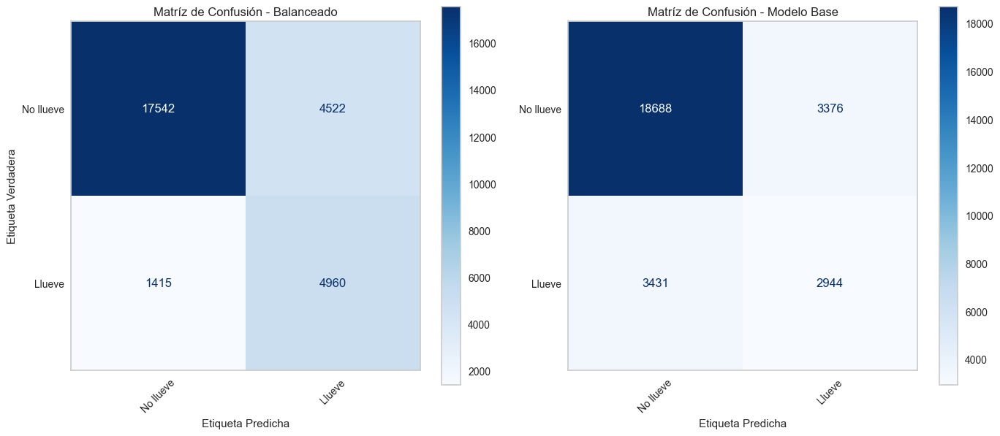

In [178]:
mat_base_1 =confusion_matrix(y_true = y_test, y_pred = y_pred_base)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6)) 
disp1 = ConfusionMatrixDisplay(mat_test_1, display_labels=['No llueve', 'Llueve'])
disp1.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax1) #type: ignore
ax1.grid(False)
ax1.set_title('Matríz de Confusión - Balanceado')
ax1.set_ylabel('Etiqueta Verdadera')
ax1.set_xlabel('Etiqueta Predicha')
disp2 = ConfusionMatrixDisplay(mat_base_1, display_labels=['No llueve', 'Llueve'])
disp2.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax2) #type: ignore
ax2.grid(False)
ax2.set_title('Matríz de Confusión - Modelo Base')
ax2.set_ylabel('')
ax2.set_xlabel('Etiqueta Predicha')
ax2.tick_params(axis='y', labelleft=True)
plt.tight_layout()

Podemos observar que el modelo base tiene un desempeño mucho menor a la hora de predecir la clase positiva, observamos un Recall de 46%. Este modelo tiende a predecir la clase negativa 'No llueve' que, a su vez, es la clase mayoritaria. Además, presenta una gran cantidad de falsos positivos, mayores a la cantidad de verdaderos positivos, lo que indica una gran cantidad de falsas alarmas.
Esto deja en claro que el modelo base no es un buen predictor de lluvias.

### Optimización de la selección de hiperparámetros

Para la optimización de la selección de hiperparámetros decidimos utilizar Optuna, que utiliza un enfoque bayesiano para ir probando combinaciones del espacio de parametros válidos para Regresión Logística. Va explorando el espacio de parámetros, probando siempre en los espacios donde se maximice la métrica de interés, en nuestro caso es el Recall. 

Esta decisión fue tomada teniendo en cuenta las dimensiones del dataset, como la cantidad de hiperparámetros a optimizar. Las combinaciónes necesarias entre Solver (liblinear, saga), el valor de la fuerza de regularización C (1e-4 a 1e+2 discretizado), el tipo de penalización (l1, l2) y el peso de las clases (None, Balanced), nos dá 80 combinaciones posibles. Si utilizaramos GridSearchCV, tendríamos que plantear los folds para cross-validation, utilizando cinco folds, el valor por defecto, nos llevaría a unos 400 fits poder explorar todo el espacio de parámetros. Este algoritmo de fuerza bruta, para este dataset, es ineficiente teniendo en cuenta el costo computacional, lo cual se traduce en elevados tiempos de ejecución.

Optuna, en cambio, define una cantidad de trials (cantidad de intentos). En cada Trial, aprende de los resultados anteriores para moverse de manera informada, por el espacio de parámetros, hacia los parámetros (numéricos o categóricos) más prometedores. A su vez, nos permite utilizar todo el rango contínuo de la fuerza de regularización de 1e-4 a 1e+2, que no podría ser posible utilizando GridSearch.


In [179]:
#Función que evalúa el modelo según su recall macro - promedio de recall entre las dos clases
def train_evaluate_model(params, X_train, y_train, X_test, y_test) -> float:
    model = LogisticRegression(**params, random_state=42, max_iter=2000)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    recall: float = float(recall_score(y_test, y_pred, average = 'macro'))
    return recall

In [180]:
#Función que define el espacio de búsqueda de los hiperparámetros - Observa el solver y su penalty asociada, C y class_weight 
def objective(trial, X_train, y_train, X_test, y_test) -> float:
    """
    Función objetivo que Optuna intentará maximizar.
    """
    #Grilla de parametros a testear
    params = {
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga']),
        'C': trial.suggest_float('C', 1e-4, 1e2, log=True),
        'class_weight': trial.suggest_categorical('class_weight', [None, 'balanced'])
    }
    
    #Según el tipo de solver acepta dos tipos de regularización l1, l2 o elasticnet
    #El solver liblinear no admite elasticnet, entonces lo excluimos si Optuna elige este solver.
    if params['solver'] == 'liblinear':
        params['penalty'] = trial.suggest_categorical('penalty_liblinear', ['l1', 'l2'])
    else:
        #Saga si lo admite, en caso de seleccionar elasticnet debemos determinar el l1_ratio
        params['penalty'] = trial.suggest_categorical('penalty_saga', ['l1', 'l2', 'elasticnet'])
        if params['penalty'] == 'elasticnet':
            params['l1_ratio'] = trial.suggest_float('l1_ratio', 0.0, 1.0)
    recall = train_evaluate_model(params, X_train, y_train, X_test, y_test)
    return recall

Tomamos la decisión de optimizar el parámetro 'class_weight' ya que es el encargado de balancear los pesos de las clases, asigna más peso a la clase minoritaria para hacerla más prevalente. Esto es necesario ya que nuestra métrica a optimizar es el Recall de la clase minoritaria. 

A partir de esto decidimos optimizar el hiperparametro C, que corresponde a la fuerza de regularización inversa. Este hiperparámetro nos permite controlar el sobreajuste. Un valor bajo de C corresponde a una regularización fuerte (bajo riesgo de sobreajuste, alto sesgo), mientras que uno alto, indica una regularización débil (alto riesgo de sobreajuste, bajo sesgo). Decidimos utilizar una escala logarítmica para que Optuna pueda evaluar todo el rango contínuo de 0.0001 a 100.

Luego, tenemos que tener en cuenta el tipo de regularización que aplicaremos, sea Lasso (l1), Ridge (l2) o Elasticnet (l1_ratio), lo que nos lleva a tener que evaluar que Solver debemos utilizar ya que el Solver por defecto no permite utilizar Elasticnet. Para ello, proporcionamos dos solvers 'liblinear' un solver rápido que permite seleccionar entre Lasso y Ridge, y 'saga' que permite seleccionar los antes mencionados y también ElasticNet. 

In [181]:
#Creación del estudio de optuna
estudio = optuna.create_study(direction='maximize')
estudio.optimize(lambda trial: objective(trial, X_train, y_train, X_test, y_test), n_trials=10, n_jobs=-1) 
print(f"Mejor Recall (macro): {estudio.best_value}")
print("Mejores hiperparámetros encontrados:")
print(estudio.best_params)

[I 2025-11-29 14:52:33,313] A new study created in memory with name: no-name-5de8f3e7-becb-4ba3-a7f4-3c3482076ef2
[I 2025-11-29 14:52:34,678] Trial 3 finished with value: 0.7792756899714199 and parameters: {'solver': 'liblinear', 'C': 0.0005239837840235826, 'class_weight': 'balanced', 'penalty_liblinear': 'l2'}. Best is trial 3 with value: 0.7792756899714199.
[I 2025-11-29 14:52:39,864] Trial 1 finished with value: 0.7860935282742538 and parameters: {'solver': 'liblinear', 'C': 0.9465031199479247, 'class_weight': 'balanced', 'penalty_liblinear': 'l1'}. Best is trial 1 with value: 0.7860935282742538.
[I 2025-11-29 14:52:41,473] Trial 5 finished with value: 0.7252665223449786 and parameters: {'solver': 'liblinear', 'C': 9.78124051135572, 'class_weight': None, 'penalty_liblinear': 'l2'}. Best is trial 1 with value: 0.7860935282742538.
[I 2025-11-29 14:52:48,840] Trial 6 finished with value: 0.7252665223449786 and parameters: {'solver': 'liblinear', 'C': 65.8440103122764, 'class_weight': N

Mejor Recall (macro): 0.7865780972287392
Mejores hiperparámetros encontrados:
{'solver': 'saga', 'C': 0.09219543709507942, 'class_weight': 'balanced', 'penalty_saga': 'elasticnet', 'l1_ratio': 0.7620085388269459}


Podemos observar que nuestro modelo obtenido por Optuna utiliza el solver 'saga', con un valor de C de 15.86, con clases balanceadas y con penalty 'l1'

Según la selección de hiperparámetros de Optuna, entrenaremos un modelo para poder visualizar sus métricas y su matriz de confusión, y compararlo con nuestro modelo balanceado.

In [182]:
mejores_parametros = estudio.best_params
if(mejores_parametros.get('penalty_saga', 0)):
    if(mejores_parametros['penalty_saga'] == 'elasticnet'):
        modelo_optuna = LogisticRegression(solver=mejores_parametros['solver'], C=mejores_parametros['C'], class_weight=mejores_parametros['class_weight'], penalty=mejores_parametros['penalty_saga'], l1_ratio=mejores_parametros['l1_ratio'], random_state=42)
    else:
        modelo_optuna = LogisticRegression(solver=mejores_parametros['solver'], C=mejores_parametros['C'], class_weight=mejores_parametros['class_weight'], penalty=mejores_parametros['penalty_saga'],random_state=42)
else:
    modelo_optuna = LogisticRegression(solver=mejores_parametros['solver'], C=mejores_parametros['C'], class_weight=mejores_parametros['class_weight'], penalty=mejores_parametros['penalty_liblinear'],random_state=42)
modelo_optuna.fit(X_train, y_train)
y_pred_optuna = modelo_optuna.predict(X_test)
print("Métricas de la regresión logística - Optuna")
reporte_optuna = classification_report(y_test, y_pred_optuna, output_dict = True)
df_reporte_optuna = pd.DataFrame(reporte_optuna).transpose()
df_reporte_optuna.style.background_gradient(cmap = 'Blues').format("{:.2f}")


Métricas de la regresión logística - Optuna


,precision,recall,f1-score,support
0,0.92,0.79,0.85,22064.00
1,0.51,0.78,0.62,6375.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.72,0.78,0.73,28439.00
weighted avg,0.83,0.78,0.80,28439.00


Podemos observar métricas similares a nuestro primer modelo implementado de LogisticRegression con clases Balanceadas, lo que nos dá la idea de que el hiperparámetro más importante es 'class_weight'.

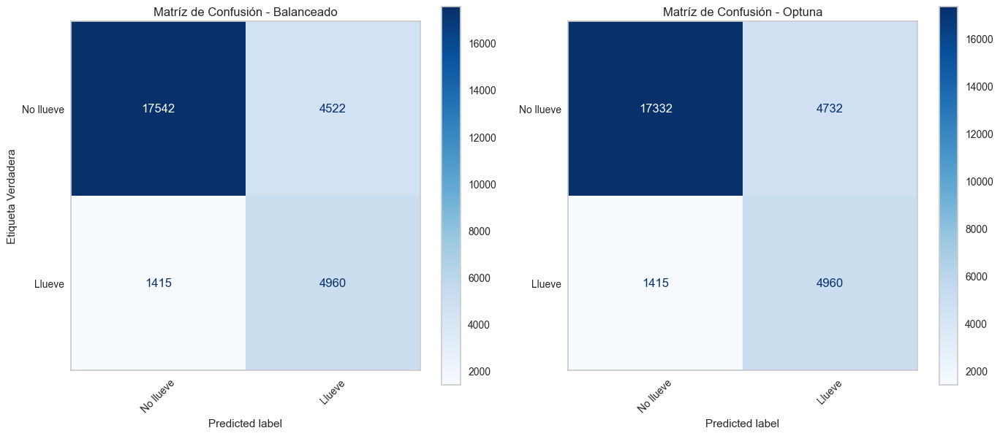

In [183]:
mat_optuna =confusion_matrix(y_true = y_test, y_pred = y_pred_optuna)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6)) 
disp1 = ConfusionMatrixDisplay(mat_test_1, display_labels=['No llueve', 'Llueve'])
disp1.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax1) #type: ignore
ax1.grid(False)
ax1.set_title('Matríz de Confusión - Balanceado')
ax1.set_ylabel('Etiqueta Verdadera')
disp2 = ConfusionMatrixDisplay(mat_optuna, display_labels=['No llueve', 'Llueve'])
disp2.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax2) #type: ignore
ax2.grid(False)
ax2.set_title('Matríz de Confusión - Optuna')
ax2.set_ylabel('')
ax2.tick_params(axis='y', labelleft=True)
plt.tight_layout()

El modelo optuna se desempeña prácticamente igual que el modelo balanceado. Podemos observar similares distribuciones entre falsos negativos, falsos positivos y verdaderos positivos, lo que nos indica que ambos modelos son buenos predictores de lluvia.

Utilizamos el visualizer de optuna para poder visualizar la importancia que asigna optuna a los hiperparametros, y confirmamos nuestra hipotesis previa, al observar un valor elevado en torno al hiperparámetro 'class_weight'.

In [184]:
vis.plot_param_importances(estudio)

Podemos observar que el hiperparámetro de más importancia es el 'class_weight'. Esto nos indica que la problemática principal de nuestro modelo de regresión logística es, de cierta manera, dejar de ignorar a la clase minoritaria. Esto se soluciona asignando un peso proporcional a la clase mayoritaria, a la clase minoritaria. Ajustar la fuerza de regularización es el segundo paso. Una vez que el modelo sabe a qué clase prestar atención, C hace el ajuste fino de la frontera.

### AutoML

Para el proceso de AutoML utilizamos PyCaret, que se encargará de hacer todo el proceso de EDA y probará una amplia gama de clasificadores para determinar cual sería el modelo optimo para utilizar en este problema de clasificación.

In [223]:
#df_pycaret = df_pycaret.dropna(subset=['RainTomorrow'])
#clasificacion = setup(data = df_pycaret, target = 'RainTomorrow', session_id=42)

<style type="text/css">
#T_ab65e_row11_col1 {
  background-color: #005b96;
}
</style>
<table id="T_ab65e">
  <thead>
    <tr>
      <th class="blank level0" >&nbsp;</th>
      <th id="T_ab65e_level0_col0" class="col_heading level0 col0" >Description</th>
      <th id="T_ab65e_level0_col1" class="col_heading level0 col1" >Value</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th id="T_ab65e_level0_row0" class="row_heading level0 row0" >0</th>
      <td id="T_ab65e_row0_col0" class="data row0 col0" >Session id</td>
      <td id="T_ab65e_row0_col1" class="data row0 col1" >42</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row1" class="row_heading level0 row1" >1</th>
      <td id="T_ab65e_row1_col0" class="data row1 col0" >Target</td>
      <td id="T_ab65e_row1_col1" class="data row1 col1" >RainTomorrow</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row2" class="row_heading level0 row2" >2</th>
      <td id="T_ab65e_row2_col0" class="data row2 col0" >Target type</td>
      <td id="T_ab65e_row2_col1" class="data row2 col1" >Binary</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row3" class="row_heading level0 row3" >3</th>
      <td id="T_ab65e_row3_col0" class="data row3 col0" >Target mapping</td>
      <td id="T_ab65e_row3_col1" class="data row3 col1" >No: 0, Yes: 1</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row4" class="row_heading level0 row4" >4</th>
      <td id="T_ab65e_row4_col0" class="data row4 col0" >Original data shape</td>
      <td id="T_ab65e_row4_col1" class="data row4 col1" >(142193, 23)</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row5" class="row_heading level0 row5" >5</th>
      <td id="T_ab65e_row5_col0" class="data row5 col0" >Transformed data shape</td>
      <td id="T_ab65e_row5_col1" class="data row5 col1" >(142193, 68)</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row6" class="row_heading level0 row6" >6</th>
      <td id="T_ab65e_row6_col0" class="data row6 col0" >Transformed train set shape</td>
      <td id="T_ab65e_row6_col1" class="data row6 col1" >(99535, 68)</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row7" class="row_heading level0 row7" >7</th>
      <td id="T_ab65e_row7_col0" class="data row7 col0" >Transformed test set shape</td>
      <td id="T_ab65e_row7_col1" class="data row7 col1" >(42658, 68)</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row8" class="row_heading level0 row8" >8</th>
      <td id="T_ab65e_row8_col0" class="data row8 col0" >Numeric features</td>
      <td id="T_ab65e_row8_col1" class="data row8 col1" >16</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row9" class="row_heading level0 row9" >9</th>
      <td id="T_ab65e_row9_col0" class="data row9 col0" >Categorical features</td>
      <td id="T_ab65e_row9_col1" class="data row9 col1" >6</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row10" class="row_heading level0 row10" >10</th>
      <td id="T_ab65e_row10_col0" class="data row10 col0" >Rows with missing values</td>
      <td id="T_ab65e_row10_col1" class="data row10 col1" >60.3%</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row11" class="row_heading level0 row11" >11</th>
      <td id="T_ab65e_row11_col0" class="data row11 col0" >Preprocess</td>
      <td id="T_ab65e_row11_col1" class="data row11 col1" >True</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row12" class="row_heading level0 row12" >12</th>
      <td id="T_ab65e_row12_col0" class="data row12 col0" >Imputation type</td>
      <td id="T_ab65e_row12_col1" class="data row12 col1" >simple</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row13" class="row_heading level0 row13" >13</th>
      <td id="T_ab65e_row13_col0" class="data row13 col0" >Numeric imputation</td>
      <td id="T_ab65e_row13_col1" class="data row13 col1" >mean</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row14" class="row_heading level0 row14" >14</th>
      <td id="T_ab65e_row14_col0" class="data row14 col0" >Categorical imputation</td>
      <td id="T_ab65e_row14_col1" class="data row14 col1" >mode</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row15" class="row_heading level0 row15" >15</th>
      <td id="T_ab65e_row15_col0" class="data row15 col0" >Maximum one-hot encoding</td>
      <td id="T_ab65e_row15_col1" class="data row15 col1" >25</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row16" class="row_heading level0 row16" >16</th>
      <td id="T_ab65e_row16_col0" class="data row16 col0" >Encoding method</td>
      <td id="T_ab65e_row16_col1" class="data row16 col1" >None</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row17" class="row_heading level0 row17" >17</th>
      <td id="T_ab65e_row17_col0" class="data row17 col0" >Fold Generator</td>
      <td id="T_ab65e_row17_col1" class="data row17 col1" >StratifiedKFold</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row18" class="row_heading level0 row18" >18</th>
      <td id="T_ab65e_row18_col0" class="data row18 col0" >Fold Number</td>
      <td id="T_ab65e_row18_col1" class="data row18 col1" >10</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row19" class="row_heading level0 row19" >19</th>
      <td id="T_ab65e_row19_col0" class="data row19 col0" >CPU Jobs</td>
      <td id="T_ab65e_row19_col1" class="data row19 col1" >-1</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row20" class="row_heading level0 row20" >20</th>
      <td id="T_ab65e_row20_col0" class="data row20 col0" >Use GPU</td>
      <td id="T_ab65e_row20_col1" class="data row20 col1" >False</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row21" class="row_heading level0 row21" >21</th>
      <td id="T_ab65e_row21_col0" class="data row21 col0" >Log Experiment</td>
      <td id="T_ab65e_row21_col1" class="data row21 col1" >False</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row22" class="row_heading level0 row22" >22</th>
      <td id="T_ab65e_row22_col0" class="data row22 col0" >Experiment Name</td>
      <td id="T_ab65e_row22_col1" class="data row22 col1" >clf-default-name</td>
    </tr>
    <tr>
      <th id="T_ab65e_level0_row23" class="row_heading level0 row23" >23</th>
      <td id="T_ab65e_row23_col0" class="data row23 col0" >USI</td>
      <td id="T_ab65e_row23_col1" class="data row23 col1" >0cf6</td>
    </tr>
  </tbody>
</table>

A partir de esta tabla podemos observar que utilizó imputación simple para rellenar la gran cantidad de faltantes, imputó las variables categoricas con la moda y las numéricas con la media.

El shape del dataset nos indica que se introdujeron 43 columnas, intuimos que tienen que ver con la codificación de cada variable mediante One-Hot Encoding.

Podemos observar que utilizará diez folds para realizar el cross validation con cada modelo.

In [224]:
#mejor_modelo = compare_models()
#mejor_modelo

A continuación se observan las métricas obtenidas por todos los modelos testeados por PyCaret:

<style type="text/css">
#T_d47c8 th {
  text-align: left;
}
#T_d47c8_row0_col0, #T_d47c8_row0_col2, #T_d47c8_row1_col0, #T_d47c8_row1_col1, #T_d47c8_row1_col3, #T_d47c8_row1_col4, #T_d47c8_row1_col5, #T_d47c8_row1_col6, #T_d47c8_row1_col7, #T_d47c8_row2_col0, #T_d47c8_row2_col1, #T_d47c8_row2_col2, #T_d47c8_row2_col3, #T_d47c8_row2_col4, #T_d47c8_row2_col5, #T_d47c8_row2_col6, #T_d47c8_row2_col7, #T_d47c8_row3_col0, #T_d47c8_row3_col1, #T_d47c8_row3_col2, #T_d47c8_row3_col3, #T_d47c8_row3_col4, #T_d47c8_row3_col5, #T_d47c8_row3_col6, #T_d47c8_row3_col7, #T_d47c8_row4_col0, #T_d47c8_row4_col1, #T_d47c8_row4_col2, #T_d47c8_row4_col3, #T_d47c8_row4_col4, #T_d47c8_row4_col5, #T_d47c8_row4_col6, #T_d47c8_row4_col7, #T_d47c8_row5_col0, #T_d47c8_row5_col1, #T_d47c8_row5_col2, #T_d47c8_row5_col3, #T_d47c8_row5_col4, #T_d47c8_row5_col5, #T_d47c8_row5_col6, #T_d47c8_row5_col7, #T_d47c8_row6_col0, #T_d47c8_row6_col1, #T_d47c8_row6_col2, #T_d47c8_row6_col3, #T_d47c8_row6_col4, #T_d47c8_row6_col5, #T_d47c8_row6_col6, #T_d47c8_row6_col7, #T_d47c8_row7_col0, #T_d47c8_row7_col1, #T_d47c8_row7_col2, #T_d47c8_row7_col3, #T_d47c8_row7_col4, #T_d47c8_row7_col5, #T_d47c8_row7_col6, #T_d47c8_row7_col7, #T_d47c8_row8_col0, #T_d47c8_row8_col1, #T_d47c8_row8_col2, #T_d47c8_row8_col3, #T_d47c8_row8_col4, #T_d47c8_row8_col5, #T_d47c8_row8_col6, #T_d47c8_row8_col7, #T_d47c8_row9_col0, #T_d47c8_row9_col1, #T_d47c8_row9_col2, #T_d47c8_row9_col3, #T_d47c8_row9_col4, #T_d47c8_row9_col5, #T_d47c8_row9_col6, #T_d47c8_row9_col7, #T_d47c8_row10_col0, #T_d47c8_row10_col1, #T_d47c8_row10_col2, #T_d47c8_row10_col3, #T_d47c8_row10_col4, #T_d47c8_row10_col5, #T_d47c8_row10_col6, #T_d47c8_row10_col7, #T_d47c8_row11_col0, #T_d47c8_row11_col1, #T_d47c8_row11_col2, #T_d47c8_row11_col3, #T_d47c8_row11_col4, #T_d47c8_row11_col5, #T_d47c8_row11_col6, #T_d47c8_row11_col7, #T_d47c8_row12_col0, #T_d47c8_row12_col1, #T_d47c8_row12_col2, #T_d47c8_row12_col3, #T_d47c8_row12_col4, #T_d47c8_row12_col5, #T_d47c8_row12_col6, #T_d47c8_row12_col7, #T_d47c8_row13_col0, #T_d47c8_row13_col1, #T_d47c8_row13_col2, #T_d47c8_row13_col3, #T_d47c8_row13_col4, #T_d47c8_row13_col5, #T_d47c8_row13_col6, #T_d47c8_row13_col7 {
  text-align: left;
}
#T_d47c8_row0_col1, #T_d47c8_row0_col3, #T_d47c8_row0_col4, #T_d47c8_row0_col5, #T_d47c8_row0_col6, #T_d47c8_row0_col7, #T_d47c8_row1_col2 {
  text-align: left;
  background-color: #005b96;
}
#T_d47c8_row0_col8, #T_d47c8_row1_col8, #T_d47c8_row2_col8, #T_d47c8_row3_col8, #T_d47c8_row4_col8, #T_d47c8_row5_col8, #T_d47c8_row6_col8, #T_d47c8_row7_col8, #T_d47c8_row8_col8, #T_d47c8_row9_col8, #T_d47c8_row10_col8, #T_d47c8_row12_col8, #T_d47c8_row13_col8 {
  text-align: left;
  background-color: #0078c1;
}
#T_d47c8_row11_col8 {
  text-align: left;
  background-color: #005b96;
  background-color: #0078c1;
}
</style>
<table id="T_d47c8">
  <thead>
    <tr>
      <th class="blank level0" >&nbsp;</th>
      <th id="T_d47c8_level0_col0" class="col_heading level0 col0" >Model</th>
      <th id="T_d47c8_level0_col1" class="col_heading level0 col1" >Accuracy</th>
      <th id="T_d47c8_level0_col2" class="col_heading level0 col2" >AUC</th>
      <th id="T_d47c8_level0_col3" class="col_heading level0 col3" >Recall</th>
      <th id="T_d47c8_level0_col4" class="col_heading level0 col4" >Prec.</th>
      <th id="T_d47c8_level0_col5" class="col_heading level0 col5" >F1</th>
      <th id="T_d47c8_level0_col6" class="col_heading level0 col6" >Kappa</th>
      <th id="T_d47c8_level0_col7" class="col_heading level0 col7" >MCC</th>
      <th id="T_d47c8_level0_col8" class="col_heading level0 col8" >TT (Sec)</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th id="T_d47c8_level0_row0" class="row_heading level0 row0" >lightgbm</th>
      <td id="T_d47c8_row0_col0" class="data row0 col0" >Light Gradient Boosting Machine</td>
      <td id="T_d47c8_row0_col1" class="data row0 col1" >0.8581</td>
      <td id="T_d47c8_row0_col2" class="data row0 col2" >0.8895</td>
      <td id="T_d47c8_row0_col3" class="data row0 col3" >0.8581</td>
      <td id="T_d47c8_row0_col4" class="data row0 col4" >0.8505</td>
      <td id="T_d47c8_row0_col5" class="data row0 col5" >0.8508</td>
      <td id="T_d47c8_row0_col6" class="data row0 col6" >0.5539</td>
      <td id="T_d47c8_row0_col7" class="data row0 col7" >0.5620</td>
      <td id="T_d47c8_row0_col8" class="data row0 col8" >2.0750</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row1" class="row_heading level0 row1" >rf</th>
      <td id="T_d47c8_row1_col0" class="data row1 col0" >Random Forest Classifier</td>
      <td id="T_d47c8_row1_col1" class="data row1 col1" >0.8571</td>
      <td id="T_d47c8_row1_col2" class="data row1 col2" >0.8917</td>
      <td id="T_d47c8_row1_col3" class="data row1 col3" >0.8571</td>
      <td id="T_d47c8_row1_col4" class="data row1 col4" >0.8495</td>
      <td id="T_d47c8_row1_col5" class="data row1 col5" >0.8465</td>
      <td id="T_d47c8_row1_col6" class="data row1 col6" >0.5356</td>
      <td id="T_d47c8_row1_col7" class="data row1 col7" >0.5512</td>
      <td id="T_d47c8_row1_col8" class="data row1 col8" >10.8880</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row2" class="row_heading level0 row2" >et</th>
      <td id="T_d47c8_row2_col0" class="data row2 col0" >Extra Trees Classifier</td>
      <td id="T_d47c8_row2_col1" class="data row2 col1" >0.8553</td>
      <td id="T_d47c8_row2_col2" class="data row2 col2" >0.8910</td>
      <td id="T_d47c8_row2_col3" class="data row2 col3" >0.8553</td>
      <td id="T_d47c8_row2_col4" class="data row2 col4" >0.8480</td>
      <td id="T_d47c8_row2_col5" class="data row2 col5" >0.8430</td>
      <td id="T_d47c8_row2_col6" class="data row2 col6" >0.5228</td>
      <td id="T_d47c8_row2_col7" class="data row2 col7" >0.5426</td>
      <td id="T_d47c8_row2_col8" class="data row2 col8" >14.4880</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row3" class="row_heading level0 row3" >gbc</th>
      <td id="T_d47c8_row3_col0" class="data row3 col0" >Gradient Boosting Classifier</td>
      <td id="T_d47c8_row3_col1" class="data row3 col1" >0.8496</td>
      <td id="T_d47c8_row3_col2" class="data row3 col2" >0.8768</td>
      <td id="T_d47c8_row3_col3" class="data row3 col3" >0.8496</td>
      <td id="T_d47c8_row3_col4" class="data row3 col4" >0.8405</td>
      <td id="T_d47c8_row3_col5" class="data row3 col5" >0.8399</td>
      <td id="T_d47c8_row3_col6" class="data row3 col6" >0.5180</td>
      <td id="T_d47c8_row3_col7" class="data row3 col7" >0.5296</td>
      <td id="T_d47c8_row3_col8" class="data row3 col8" >15.9550</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row4" class="row_heading level0 row4" >lr</th>
      <td id="T_d47c8_row4_col0" class="data row4 col0" >Logistic Regression</td>
      <td id="T_d47c8_row4_col1" class="data row4 col1" >0.8435</td>
      <td id="T_d47c8_row4_col2" class="data row4 col2" >0.8674</td>
      <td id="T_d47c8_row4_col3" class="data row4 col3" >0.8435</td>
      <td id="T_d47c8_row4_col4" class="data row4 col4" >0.8332</td>
      <td id="T_d47c8_row4_col5" class="data row4 col5" >0.8324</td>
      <td id="T_d47c8_row4_col6" class="data row4 col6" >0.4940</td>
      <td id="T_d47c8_row4_col7" class="data row4 col7" >0.5071</td>
      <td id="T_d47c8_row4_col8" class="data row4 col8" >16.1040</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row5" class="row_heading level0 row5" >lda</th>
      <td id="T_d47c8_row5_col0" class="data row5 col0" >Linear Discriminant Analysis</td>
      <td id="T_d47c8_row5_col1" class="data row5 col1" >0.8434</td>
      <td id="T_d47c8_row5_col2" class="data row5 col2" >0.8688</td>
      <td id="T_d47c8_row5_col3" class="data row5 col3" >0.8434</td>
      <td id="T_d47c8_row5_col4" class="data row5 col4" >0.8336</td>
      <td id="T_d47c8_row5_col5" class="data row5 col5" >0.8343</td>
      <td id="T_d47c8_row5_col6" class="data row5 col6" >0.5030</td>
      <td id="T_d47c8_row5_col7" class="data row5 col7" >0.5122</td>
      <td id="T_d47c8_row5_col8" class="data row5 col8" >1.4070</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row6" class="row_heading level0 row6" >ridge</th>
      <td id="T_d47c8_row6_col0" class="data row6 col0" >Ridge Classifier</td>
      <td id="T_d47c8_row6_col1" class="data row6 col1" >0.8426</td>
      <td id="T_d47c8_row6_col2" class="data row6 col2" >0.8688</td>
      <td id="T_d47c8_row6_col3" class="data row6 col3" >0.8426</td>
      <td id="T_d47c8_row6_col4" class="data row6 col4" >0.8325</td>
      <td id="T_d47c8_row6_col5" class="data row6 col5" >0.8281</td>
      <td id="T_d47c8_row6_col6" class="data row6 col6" >0.4764</td>
      <td id="T_d47c8_row6_col7" class="data row6 col7" >0.4969</td>
      <td id="T_d47c8_row6_col8" class="data row6 col8" >1.0800</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row7" class="row_heading level0 row7" >ada</th>
      <td id="T_d47c8_row7_col0" class="data row7 col0" >Ada Boost Classifier</td>
      <td id="T_d47c8_row7_col1" class="data row7 col1" >0.8419</td>
      <td id="T_d47c8_row7_col2" class="data row7 col2" >0.8636</td>
      <td id="T_d47c8_row7_col3" class="data row7 col3" >0.8419</td>
      <td id="T_d47c8_row7_col4" class="data row7 col4" >0.8318</td>
      <td id="T_d47c8_row7_col5" class="data row7 col5" >0.8326</td>
      <td id="T_d47c8_row7_col6" class="data row7 col6" >0.4973</td>
      <td id="T_d47c8_row7_col7" class="data row7 col7" >0.5068</td>
      <td id="T_d47c8_row7_col8" class="data row7 col8" >5.1960</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row8" class="row_heading level0 row8" >knn</th>
      <td id="T_d47c8_row8_col0" class="data row8 col0" >K Neighbors Classifier</td>
      <td id="T_d47c8_row8_col1" class="data row8 col1" >0.8329</td>
      <td id="T_d47c8_row8_col2" class="data row8 col2" >0.8124</td>
      <td id="T_d47c8_row8_col3" class="data row8 col3" >0.8329</td>
      <td id="T_d47c8_row8_col4" class="data row8 col4" >0.8220</td>
      <td id="T_d47c8_row8_col5" class="data row8 col5" >0.8239</td>
      <td id="T_d47c8_row8_col6" class="data row8 col6" >0.4729</td>
      <td id="T_d47c8_row8_col7" class="data row8 col7" >0.4805</td>
      <td id="T_d47c8_row8_col8" class="data row8 col8" >11.6100</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row9" class="row_heading level0 row9" >dt</th>
      <td id="T_d47c8_row9_col0" class="data row9 col0" >Decision Tree Classifier</td>
      <td id="T_d47c8_row9_col1" class="data row9 col1" >0.7946</td>
      <td id="T_d47c8_row9_col2" class="data row9 col2" >0.7080</td>
      <td id="T_d47c8_row9_col3" class="data row9 col3" >0.7946</td>
      <td id="T_d47c8_row9_col4" class="data row9 col4" >0.7959</td>
      <td id="T_d47c8_row9_col5" class="data row9 col5" >0.7952</td>
      <td id="T_d47c8_row9_col6" class="data row9 col6" >0.4132</td>
      <td id="T_d47c8_row9_col7" class="data row9 col7" >0.4133</td>
      <td id="T_d47c8_row9_col8" class="data row9 col8" >1.9690</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row10" class="row_heading level0 row10" >svm</th>
      <td id="T_d47c8_row10_col0" class="data row10 col0" >SVM - Linear Kernel</td>
      <td id="T_d47c8_row10_col1" class="data row10 col1" >0.7839</td>
      <td id="T_d47c8_row10_col2" class="data row10 col2" >0.8626</td>
      <td id="T_d47c8_row10_col3" class="data row10 col3" >0.7839</td>
      <td id="T_d47c8_row10_col4" class="data row10 col4" >0.8274</td>
      <td id="T_d47c8_row10_col5" class="data row10 col5" >0.7726</td>
      <td id="T_d47c8_row10_col6" class="data row10 col6" >0.3806</td>
      <td id="T_d47c8_row10_col7" class="data row10 col7" >0.4233</td>
      <td id="T_d47c8_row10_col8" class="data row10 col8" >6.7990</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row11" class="row_heading level0 row11" >dummy</th>
      <td id="T_d47c8_row11_col0" class="data row11 col0" >Dummy Classifier</td>
      <td id="T_d47c8_row11_col1" class="data row11 col1" >0.7758</td>
      <td id="T_d47c8_row11_col2" class="data row11 col2" >0.5000</td>
      <td id="T_d47c8_row11_col3" class="data row11 col3" >0.7758</td>
      <td id="T_d47c8_row11_col4" class="data row11 col4" >0.6019</td>
      <td id="T_d47c8_row11_col5" class="data row11 col5" >0.6779</td>
      <td id="T_d47c8_row11_col6" class="data row11 col6" >0.0000</td>
      <td id="T_d47c8_row11_col7" class="data row11 col7" >0.0000</td>
      <td id="T_d47c8_row11_col8" class="data row11 col8" >0.8750</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row12" class="row_heading level0 row12" >nb</th>
      <td id="T_d47c8_row12_col0" class="data row12 col0" >Naive Bayes</td>
      <td id="T_d47c8_row12_col1" class="data row12 col1" >0.7405</td>
      <td id="T_d47c8_row12_col2" class="data row12 col2" >0.7868</td>
      <td id="T_d47c8_row12_col3" class="data row12 col3" >0.7405</td>
      <td id="T_d47c8_row12_col4" class="data row12 col4" >0.7864</td>
      <td id="T_d47c8_row12_col5" class="data row12 col5" >0.7557</td>
      <td id="T_d47c8_row12_col6" class="data row12 col6" >0.3602</td>
      <td id="T_d47c8_row12_col7" class="data row12 col7" >0.3728</td>
      <td id="T_d47c8_row12_col8" class="data row12 col8" >1.0590</td>
    </tr>
    <tr>
      <th id="T_d47c8_level0_row13" class="row_heading level0 row13" >qda</th>
      <td id="T_d47c8_row13_col0" class="data row13 col0" >Quadratic Discriminant Analysis</td>
      <td id="T_d47c8_row13_col1" class="data row13 col1" >0.7063</td>
      <td id="T_d47c8_row13_col2" class="data row13 col2" >0.7642</td>
      <td id="T_d47c8_row13_col3" class="data row13 col3" >0.7063</td>
      <td id="T_d47c8_row13_col4" class="data row13 col4" >0.7791</td>
      <td id="T_d47c8_row13_col5" class="data row13 col5" >0.7261</td>
      <td id="T_d47c8_row13_col6" class="data row13 col6" >0.3185</td>
      <td id="T_d47c8_row13_col7" class="data row13 col7" >0.3406</td>
      <td id="T_d47c8_row13_col8" class="data row13 col8" >1.4970</td>
    </tr>
  </tbody>
</table>

Confirmamos que realizó One-Hot Encoding para cada variable categórica

In [225]:
#get_config('X_train_transformed').columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir_NW', 'WindGustDir_NE', 'WindGustDir_N',
       'WindGustDir_W', 'WindGustDir_ENE', 'WindGustDir_WNW', 'WindGustDir_S',
       'WindGustDir_E', 'WindGustDir_SW', 'WindGustDir_SSW', 'WindGustDir_SSE',
       'WindGustDir_WSW', 'WindGustDir_ESE', 'WindGustDir_SE',
       'WindGustDir_NNW', 'WindGustDir_NNE', 'WindGustSpeed', 'WindDir9am_SSW',
       'WindDir9am_NNW', 'WindDir9am_NNE', 'WindDir9am_WNW', 'WindDir9am_NE',
       'WindDir9am_NW', 'WindDir9am_SW', 'WindDir9am_ENE', 'WindDir9am_W',
       'WindDir9am_N', 'WindDir9am_SE', 'WindDir9am_ESE', 'WindDir9am_E',
       'WindDir9am_SSE', 'WindDir9am_WSW', 'WindDir9am_S', 'WindDir3pm_SE',
       'WindDir3pm_NW', 'WindDir3pm_ENE', 'WindDir3pm_N', 'WindDir3pm_WNW',
       'WindDir3pm_NNW', 'WindDir3pm_S', 'WindDir3pm_ESE', 'WindDir3pm_W',
       'WindDir3pm_SSE', 'WindDir3pm_E', 'WindDir3pm_WSW', 'WindDir3pm_SSW',
       'WindDir3pm_SW', 'WindDir3pm_NE', 'WindDir3pm_NNE', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
       'RainToday'],
      dtype='object')

El modelo elegido por PyCaret es LGBM Classifier con los siguentes valores para sus hiperparámetros:

<style>#sk-container-id-2 {
  /* Definition of color scheme common for light and dark mode */
  --sklearn-color-text: black;
  --sklearn-color-line: gray;
  /* Definition of color scheme for unfitted estimators */
  --sklearn-color-unfitted-level-0: #fff5e6;
  --sklearn-color-unfitted-level-1: #f6e4d2;
  --sklearn-color-unfitted-level-2: #ffe0b3;
  --sklearn-color-unfitted-level-3: chocolate;
  /* Definition of color scheme for fitted estimators */
  --sklearn-color-fitted-level-0: #f0f8ff;
  --sklearn-color-fitted-level-1: #d4ebff;
  --sklearn-color-fitted-level-2: #b3dbfd;
  --sklearn-color-fitted-level-3: cornflowerblue;

  /* Specific color for light theme */
  --sklearn-color-text-on-default-background: var(--sg-text-color, var(--theme-code-foreground, var(--jp-content-font-color1, black)));
  --sklearn-color-background: var(--sg-background-color, var(--theme-background, var(--jp-layout-color0, white)));
  --sklearn-color-border-box: var(--sg-text-color, var(--theme-code-foreground, var(--jp-content-font-color1, black)));
  --sklearn-color-icon: #696969;

  @media (prefers-color-scheme: dark) {
    /* Redefinition of color scheme for dark theme */
    --sklearn-color-text-on-default-background: var(--sg-text-color, var(--theme-code-foreground, var(--jp-content-font-color1, white)));
    --sklearn-color-background: var(--sg-background-color, var(--theme-background, var(--jp-layout-color0, #111)));
    --sklearn-color-border-box: var(--sg-text-color, var(--theme-code-foreground, var(--jp-content-font-color1, white)));
    --sklearn-color-icon: #878787;
  }
}

#sk-container-id-2 {
  color: var(--sklearn-color-text);
}

#sk-container-id-2 pre {
  padding: 0;
}

#sk-container-id-2 input.sk-hidden--visually {
  border: 0;
  clip: rect(1px 1px 1px 1px);
  clip: rect(1px, 1px, 1px, 1px);
  height: 1px;
  margin: -1px;
  overflow: hidden;
  padding: 0;
  position: absolute;
  width: 1px;
}

#sk-container-id-2 div.sk-dashed-wrapped {
  border: 1px dashed var(--sklearn-color-line);
  margin: 0 0.4em 0.5em 0.4em;
  box-sizing: border-box;
  padding-bottom: 0.4em;
  background-color: var(--sklearn-color-background);
}

#sk-container-id-2 div.sk-container {
  /* jupyter's `normalize.less` sets `[hidden] { display: none; }`
     but bootstrap.min.css set `[hidden] { display: none !important; }`
     so we also need the `!important` here to be able to override the
     default hidden behavior on the sphinx rendered scikit-learn.org.
     See: https://github.com/scikit-learn/scikit-learn/issues/21755 */
  display: inline-block !important;
  position: relative;
}

#sk-container-id-2 div.sk-text-repr-fallback {
  display: none;
}

div.sk-parallel-item,
div.sk-serial,
div.sk-item {
  /* draw centered vertical line to link estimators */
  background-image: linear-gradient(var(--sklearn-color-text-on-default-background), var(--sklearn-color-text-on-default-background));
  background-size: 2px 100%;
  background-repeat: no-repeat;
  background-position: center center;
}

/* Parallel-specific style estimator block */

#sk-container-id-2 div.sk-parallel-item::after {
  content: "";
  width: 100%;
  border-bottom: 2px solid var(--sklearn-color-text-on-default-background);
  flex-grow: 1;
}

#sk-container-id-2 div.sk-parallel {
  display: flex;
  align-items: stretch;
  justify-content: center;
  background-color: var(--sklearn-color-background);
  position: relative;
}

#sk-container-id-2 div.sk-parallel-item {
  display: flex;
  flex-direction: column;
}

#sk-container-id-2 div.sk-parallel-item:first-child::after {
  align-self: flex-end;
  width: 50%;
}

#sk-container-id-2 div.sk-parallel-item:last-child::after {
  align-self: flex-start;
  width: 50%;
}

#sk-container-id-2 div.sk-parallel-item:only-child::after {
  width: 0;
}

/* Serial-specific style estimator block */

#sk-container-id-2 div.sk-serial {
  display: flex;
  flex-direction: column;
  align-items: center;
  background-color: var(--sklearn-color-background);
  padding-right: 1em;
  padding-left: 1em;
}


/* Toggleable style: style used for estimator/Pipeline/ColumnTransformer box that is
clickable and can be expanded/collapsed.
- Pipeline and ColumnTransformer use this feature and define the default style
- Estimators will overwrite some part of the style using the `sk-estimator` class
*/

/* Pipeline and ColumnTransformer style (default) */

#sk-container-id-2 div.sk-toggleable {
  /* Default theme specific background. It is overwritten whether we have a
  specific estimator or a Pipeline/ColumnTransformer */
  background-color: var(--sklearn-color-background);
}

/* Toggleable label */
#sk-container-id-2 label.sk-toggleable__label {
  cursor: pointer;
  display: block;
  width: 100%;
  margin-bottom: 0;
  padding: 0.5em;
  box-sizing: border-box;
  text-align: center;
}

#sk-container-id-2 label.sk-toggleable__label-arrow:before {
  /* Arrow on the left of the label */
  content: "▸";
  float: left;
  margin-right: 0.25em;
  color: var(--sklearn-color-icon);
}

#sk-container-id-2 label.sk-toggleable__label-arrow:hover:before {
  color: var(--sklearn-color-text);
}

/* Toggleable content - dropdown */

#sk-container-id-2 div.sk-toggleable__content {
  max-height: 0;
  max-width: 0;
  overflow: hidden;
  text-align: left;
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-0);
}

#sk-container-id-2 div.sk-toggleable__content.fitted {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-0);
}

#sk-container-id-2 div.sk-toggleable__content pre {
  margin: 0.2em;
  border-radius: 0.25em;
  color: var(--sklearn-color-text);
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-0);
}

#sk-container-id-2 div.sk-toggleable__content.fitted pre {
  /* unfitted */
  background-color: var(--sklearn-color-fitted-level-0);
}

#sk-container-id-2 input.sk-toggleable__control:checked~div.sk-toggleable__content {
  /* Expand drop-down */
  max-height: 200px;
  max-width: 100%;
  overflow: auto;
}

#sk-container-id-2 input.sk-toggleable__control:checked~label.sk-toggleable__label-arrow:before {
  content: "▾";
}

/* Pipeline/ColumnTransformer-specific style */

#sk-container-id-2 div.sk-label input.sk-toggleable__control:checked~label.sk-toggleable__label {
  color: var(--sklearn-color-text);
  background-color: var(--sklearn-color-unfitted-level-2);
}

#sk-container-id-2 div.sk-label.fitted input.sk-toggleable__control:checked~label.sk-toggleable__label {
  background-color: var(--sklearn-color-fitted-level-2);
}

/* Estimator-specific style */

/* Colorize estimator box */
#sk-container-id-2 div.sk-estimator input.sk-toggleable__control:checked~label.sk-toggleable__label {
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-2);
}

#sk-container-id-2 div.sk-estimator.fitted input.sk-toggleable__control:checked~label.sk-toggleable__label {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-2);
}

#sk-container-id-2 div.sk-label label.sk-toggleable__label,
#sk-container-id-2 div.sk-label label {
  /* The background is the default theme color */
  color: var(--sklearn-color-text-on-default-background);
}

/* On hover, darken the color of the background */
#sk-container-id-2 div.sk-label:hover label.sk-toggleable__label {
  color: var(--sklearn-color-text);
  background-color: var(--sklearn-color-unfitted-level-2);
}

/* Label box, darken color on hover, fitted */
#sk-container-id-2 div.sk-label.fitted:hover label.sk-toggleable__label.fitted {
  color: var(--sklearn-color-text);
  background-color: var(--sklearn-color-fitted-level-2);
}

/* Estimator label */

#sk-container-id-2 div.sk-label label {
  font-family: monospace;
  font-weight: bold;
  display: inline-block;
  line-height: 1.2em;
}

#sk-container-id-2 div.sk-label-container {
  text-align: center;
}

/* Estimator-specific */
#sk-container-id-2 div.sk-estimator {
  font-family: monospace;
  border: 1px dotted var(--sklearn-color-border-box);
  border-radius: 0.25em;
  box-sizing: border-box;
  margin-bottom: 0.5em;
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-0);
}

#sk-container-id-2 div.sk-estimator.fitted {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-0);
}

/* on hover */
#sk-container-id-2 div.sk-estimator:hover {
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-2);
}

#sk-container-id-2 div.sk-estimator.fitted:hover {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-2);
}

/* Specification for estimator info (e.g. "i" and "?") */

/* Common style for "i" and "?" */

.sk-estimator-doc-link,
a:link.sk-estimator-doc-link,
a:visited.sk-estimator-doc-link {
  float: right;
  font-size: smaller;
  line-height: 1em;
  font-family: monospace;
  background-color: var(--sklearn-color-background);
  border-radius: 1em;
  height: 1em;
  width: 1em;
  text-decoration: none !important;
  margin-left: 1ex;
  /* unfitted */
  border: var(--sklearn-color-unfitted-level-1) 1pt solid;
  color: var(--sklearn-color-unfitted-level-1);
}

.sk-estimator-doc-link.fitted,
a:link.sk-estimator-doc-link.fitted,
a:visited.sk-estimator-doc-link.fitted {
  /* fitted */
  border: var(--sklearn-color-fitted-level-1) 1pt solid;
  color: var(--sklearn-color-fitted-level-1);
}

/* On hover */
div.sk-estimator:hover .sk-estimator-doc-link:hover,
.sk-estimator-doc-link:hover,
div.sk-label-container:hover .sk-estimator-doc-link:hover,
.sk-estimator-doc-link:hover {
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-3);
  color: var(--sklearn-color-background);
  text-decoration: none;
}

div.sk-estimator.fitted:hover .sk-estimator-doc-link.fitted:hover,
.sk-estimator-doc-link.fitted:hover,
div.sk-label-container:hover .sk-estimator-doc-link.fitted:hover,
.sk-estimator-doc-link.fitted:hover {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-3);
  color: var(--sklearn-color-background);
  text-decoration: none;
}

/* Span, style for the box shown on hovering the info icon */
.sk-estimator-doc-link span {
  display: none;
  z-index: 9999;
  position: relative;
  font-weight: normal;
  right: .2ex;
  padding: .5ex;
  margin: .5ex;
  width: min-content;
  min-width: 20ex;
  max-width: 50ex;
  color: var(--sklearn-color-text);
  box-shadow: 2pt 2pt 4pt #999;
  /* unfitted */
  background: var(--sklearn-color-unfitted-level-0);
  border: .5pt solid var(--sklearn-color-unfitted-level-3);
}

.sk-estimator-doc-link.fitted span {
  /* fitted */
  background: var(--sklearn-color-fitted-level-0);
  border: var(--sklearn-color-fitted-level-3);
}

.sk-estimator-doc-link:hover span {
  display: block;
}

/* "?"-specific style due to the `<a>` HTML tag */

#sk-container-id-2 a.estimator_doc_link {
  float: right;
  font-size: 1rem;
  line-height: 1em;
  font-family: monospace;
  background-color: var(--sklearn-color-background);
  border-radius: 1rem;
  height: 1rem;
  width: 1rem;
  text-decoration: none;
  /* unfitted */
  color: var(--sklearn-color-unfitted-level-1);
  border: var(--sklearn-color-unfitted-level-1) 1pt solid;
}

#sk-container-id-2 a.estimator_doc_link.fitted {
  /* fitted */
  border: var(--sklearn-color-fitted-level-1) 1pt solid;
  color: var(--sklearn-color-fitted-level-1);
}

/* On hover */
#sk-container-id-2 a.estimator_doc_link:hover {
  /* unfitted */
  background-color: var(--sklearn-color-unfitted-level-3);
  color: var(--sklearn-color-background);
  text-decoration: none;
}

#sk-container-id-2 a.estimator_doc_link.fitted:hover {
  /* fitted */
  background-color: var(--sklearn-color-fitted-level-3);
}
</style>
<div id="sk-container-id-2" class="sk-top-container"><div class="sk-text-repr-fallback"><pre>LGBMClassifier(boosting_type=&#x27;gbdt&#x27;, class_weight=None, colsample_bytree=1.0,
               importance_type=&#x27;split&#x27;, learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)</pre><b>In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. <br />On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.</b></div><div class="sk-container" hidden><div class="sk-item"><div class="sk-estimator fitted sk-toggleable"><input class="sk-toggleable__control sk-hidden--visually" id="sk-estimator-id-2" type="checkbox" checked><label for="sk-estimator-id-2" class="sk-toggleable__label fitted sk-toggleable__label-arrow fitted">&nbsp;LGBMClassifier<span class="sk-estimator-doc-link fitted">i<span>Fitted</span></span></label><div class="sk-toggleable__content fitted"><pre>LGBMClassifier(boosting_type=&#x27;gbdt&#x27;, class_weight=None, colsample_bytree=1.0,
               importance_type=&#x27;split&#x27;, learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)</pre></div> </div></div></div></div>

Podemos observar las métricas y matrices de confusión y compararlas con nuestro modelo de regresión logística

In [226]:
#print('Métricas en Test')
#metricas_pycaret = predict_model(mejor_modelo)
#plot_model(mejor_modelo, plot = 'confusion_matrix', scale = 0.7)

Métricas en Test - PyCaret

<style type="text/css">
</style>
<table id="T_70df4">
  <thead>
    <tr>
      <th class="blank level0" >&nbsp;</th>
      <th id="T_70df4_level0_col0" class="col_heading level0 col0" >Model</th>
      <th id="T_70df4_level0_col1" class="col_heading level0 col1" >Accuracy</th>
      <th id="T_70df4_level0_col2" class="col_heading level0 col2" >AUC</th>
      <th id="T_70df4_level0_col3" class="col_heading level0 col3" >Recall</th>
      <th id="T_70df4_level0_col4" class="col_heading level0 col4" >Prec.</th>
      <th id="T_70df4_level0_col5" class="col_heading level0 col5" >F1</th>
      <th id="T_70df4_level0_col6" class="col_heading level0 col6" >Kappa</th>
      <th id="T_70df4_level0_col7" class="col_heading level0 col7" >MCC</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th id="T_70df4_level0_row0" class="row_heading level0 row0" >0</th>
      <td id="T_70df4_row0_col0" class="data row0 col0" >Light Gradient Boosting Machine</td>
      <td id="T_70df4_row0_col1" class="data row0 col1" >0.8617</td>
      <td id="T_70df4_row0_col2" class="data row0 col2" >0.8936</td>
      <td id="T_70df4_row0_col3" class="data row0 col3" >0.8617</td>
      <td id="T_70df4_row0_col4" class="data row0 col4" >0.8546</td>
      <td id="T_70df4_row0_col5" class="data row0 col5" >0.8546</td>
      <td id="T_70df4_row0_col6" class="data row0 col6" >0.5653</td>
      <td id="T_70df4_row0_col7" class="data row0 col7" >0.5735</td>
    </tr>
  </tbody>
</table>

![Matriz de Confusión PyCaret](PyCaret_ConfMat.png)

El modelo realizado por PyCaret, según lo observado en la matriz de confusión, tiene una tendencia a predecir la clase negativa, ya que el Recall de la clase positiva es solamente del 57%, es decir, falla en encontrar el 43% de los días en que realmente va a llover. Genera muy pocos falsos positivos, pero muchos falsos negativos, reforzando así la tendencia a predecir la clase negativa. Esto nos da la idea que el modelo obtenido por PyCaret no es un buen predictor de lluvia.

### SHAP

Para poder entender cómo realiza las predicciones el modelo, utilizamos SHAP. Lo que nos permite, a partir de los shap values calculados, ver cuales son las variables intervinientes que más aportan a la hora de elegir una clase u otra como predicción.

In [189]:
explainer = shap.Explainer(modelo_logistic, X_train, feature_names=modelo_logistic.feature_names_in_)
shap_values = explainer(X_test)

#### Análisis Global

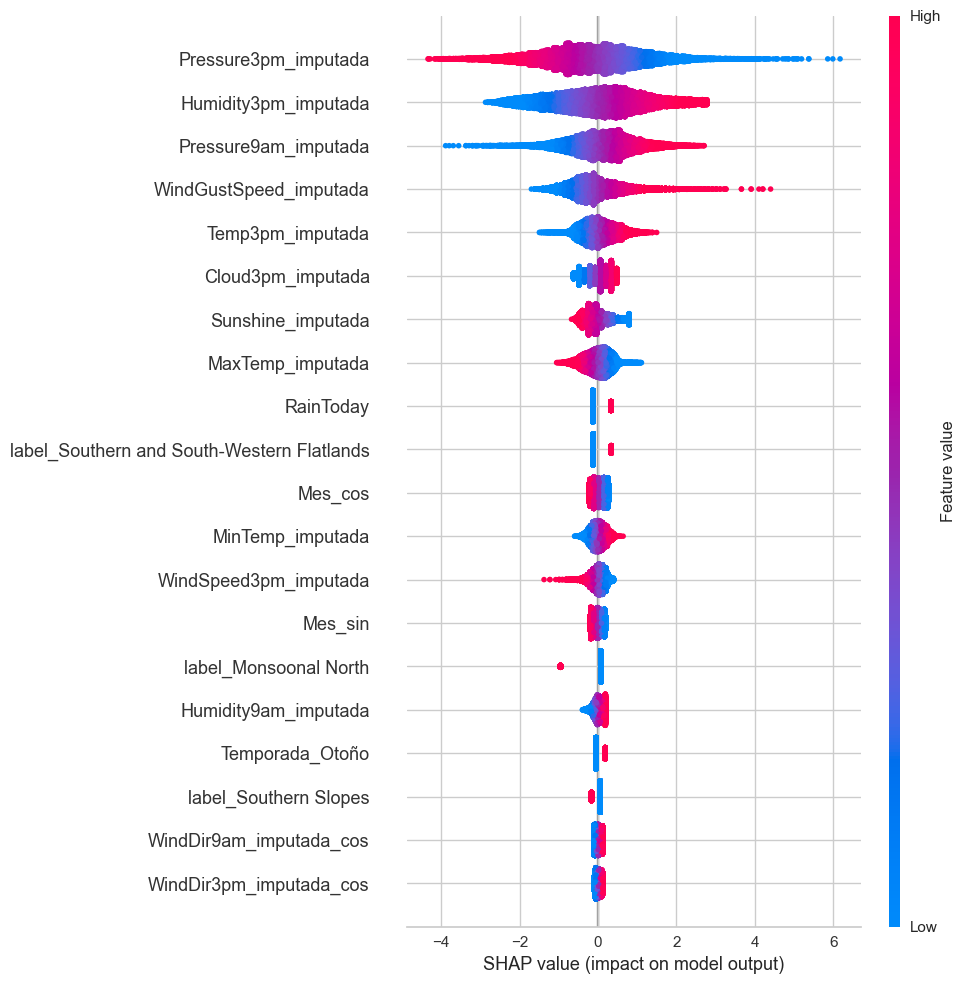

In [190]:
shap.summary_plot(
    shap_values, 
    X_test,
    plot_size=(10,10)
)

Este gráfico 'Beeswarm' o Summary, nos muestra cuales son las features que presentan más relevancia a la hora de predecir lluvia de manera global. La feature más significativa para la predicción es la que está en la extremo superior del gráfico ('Pressure3pm_imputada') y la menos significativa, en el extremo inferior (WindDir3pm_imputada_sin).

A partir de esto, podemos centrar nuestro análisis en cada variable. Cada uno de los puntos observados en la gráfica representa un valor SHAP obtenido por feature, por fila. Para valores SHAP mayores a cero, podemos decir que empujan la predicción hacia 'Llueve' y para valores SHAP negativos hacia 'No llueve'. 

Teniendo en cuenta esto, si el SHAP value es positivo, y observamos un feature value 'High', entendemos que esa feature debe tomar un valor alto para poder empujar la predicción a 'Llueve', en caso contrario, es decir, si presenta un valor bajo, la predicción será 'No Llueve'. Si invertimos la lógica, tomando SHAP values negativos, podemos inferir de la misma manera el valor predictivo de cada feature ahora teniendo en cuenta que focalizamos nuestro análisis en la clase 'No llueve'.

Globalmente, entonces, las variables que mas 'peso' presentan a la hora de predecir son:

Centrando nuestro análisis en la clase **'Llueve'**:

**Pressure3pm_imputada** - Debe asumir valores bajos

**Humidity3pm_imputada** - Debe asumir valores altos

**Pressure9am_imputada**- Debe asumir valores altos 

**WindGustSpeed_imputada** - Debe asumir valores altos

**Temp3pm_imputada** - Debe asumir valores altos

**MaxTemp_imputada** - Debe asumir valores bajos

**Sunshine_imputada** - Debe asumir valores bajos

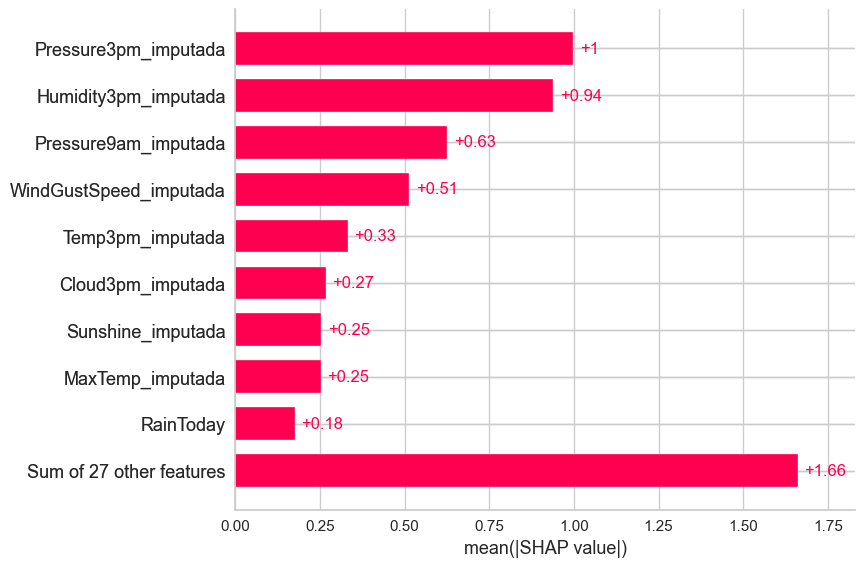

In [191]:
shap.plots.bar(shap_values)

En este gráfico de barras se pueden pueden observar los valores SHAP promedio para cada feature. El valor en el eje horizontal representa la importancia promedio de la característica en las predicciones que realiza el modelo. A mayor valor, más influencia tiene. Cabe aclarar que los valores promedio solo sirven para determinar cuanta influencia tiene la feature en la predicción del modelo, pero no si empujan la predicción hacia la clase positiva o la negativa. Notamos, además que las variables más significativas se corresponden uno a uno con las del gráfico anterior.

#### Análisis Local

Para poder hacer nuestro análisis local, nos valdremos del Waterfall plot y el Force plot para ver como intervienen las fuerzas de las features a la hora de realizar una predicción para un registro en particular.

Observamos primero el caso de predicción positiva - clase 1 o 'Llueve' mediante un Waterfall plot

In [192]:
#Hallamos los indices donde las predicciones sean 0
#Esto nos permite variar el valor de indices_lluvia[i] con i >=0 ^ i <= len(y_test_predict)-1 
#para poder ver otras predicciones negativas
indices_lluvia = np.where(y_test_predict == 1)[0]
posicion_ejemplo_positivo = indices_lluvia[0]
#Registro correspondiente a la predicción:
#X_test.iloc[[posicion_ejemplo_positivo]]

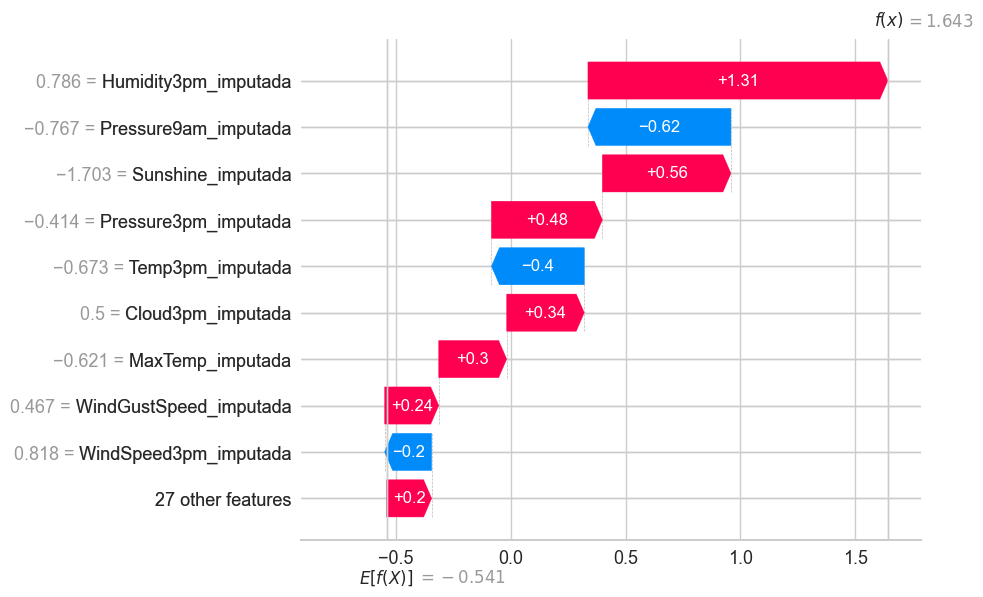

In [193]:
shap.plots.waterfall(shap_values[posicion_ejemplo_positivo])

A primera vista podemos observar el valor E [ f(X) ] = -0.543 que corresponde al valor promedio de la predicción. Como es un valor negativo nos da a entender que, en promedio, nuestras predicciones están sesgadas hacia 'No llueve'.
A partir de ello, podemos observar, de abajo hacia arriba, cómo intervienen las features a la hora de realizar la decisión ordenadas por importancia de menor a mayor.
Las cuatro features de mayor importancia, en este caso, son 'Humidity3pm_imputada', 'Pressure9am_imputada', 'Sunshine_imputada' y 'Pressure3pm_imputada'. 
Esto quiere decir que:

- Si hay un valor bajo de presión a las 3pm (-0.4), empujará la predicción hacia 'Llueve' (+0.48)
- Si hay un valor bajo de resplandor (-1.7), empujará la predicción hacia 'Llueve' (+0.56)
- Si hay un valor bajo de presión a las 9am (-0.7), empujará la predicción hacia 'No Llueve' (-0.62)
- Si hay un valor alto de humedad a las 3pm (0.79), empujará la predicción hacia 'Llueve'(+1.31)

En este caso, la suma de las fuerzas de todas las features es mayor a 0, lo que nos indica que nuestro modelo predijo 'Lluvia' para este registro.




A continuación observaremos el caso de predicción negativa - clase 0 o 'No llueve' mediante un Force plot

In [194]:
#Hallamos los indices donde las predicciones sean 1
#Podemos variar de la misma manera el indice para obtener otras predicciones positivas
indices_lluvia = np.where(y_test_predict == 0)[0]
posicion_ejemplo_negativo = indices_lluvia[0]
#Registro correspondiente a la predicción:
#X_test.iloc[[posicion_ejemplo_negativo]]

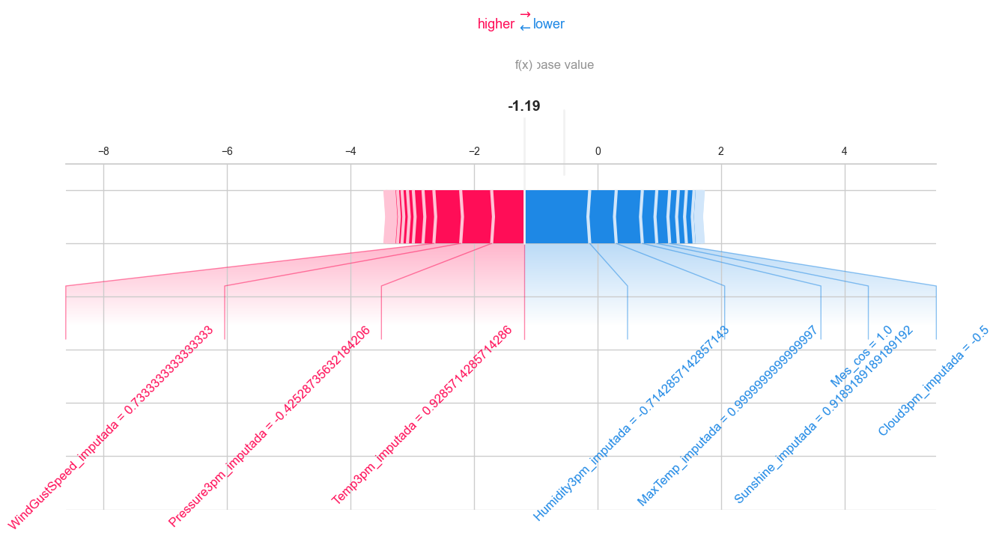

In [195]:
shap.plots.force(
    base_value=shap_values[posicion_ejemplo_negativo].base_values, 
    shap_values=shap_values[posicion_ejemplo_negativo].values,
    features=X_test.iloc[posicion_ejemplo_negativo], 
    feature_names=X_test.columns.to_list(),
    matplotlib=True,
    text_rotation=45,
    figsize=(15, 6)
)

A diferencia del Waterfall plot que nos muestra la suma de las fuerzas de las features desagregadas, feature por feature, el Force plot muestra cómo interactua la agrupación de fuerzas positivas contra la de las negativas de manera directa. La predicción obtenida es denotada por f(x) = -0.90 lo que nos indica, en este caso, que la magnitud de la agrupación de las fuerzas negativas es mayor. Esto da como resultado una predicción de la clase 'No llueve', ya que el valor obtenido es menor a cero.

## Red Neuronal

Según lo hablado en clase y lo desarrollado en consultas posteriores sobre las métricas a elegir, tomamos la decisión a partir de este punto de focalizar nuestros esfuerzos en maximizar el f1-score. Notamos que utilizar el recall de la clase positiva para cuantificar que tan bueno es nuestro modelo como predictor de lluvias nos deja expuestos a un modelo tan sencillo como uno que siempre prediga la clase positiva. Observaríamos una precisión bajísima pero un recall perfecto. Observando nuestros valores de precisión en modelos anteriores, que rondan entre el 50% y 52%, detectamos que de todas las predicciones reales lluvia el 50% aproximadamente son falsos positivos, lo que daría poca fiabilidad a nuestro modelo. Decidimos balancear la precisión y el recall utilizando el f1-score para que nuestro predictor de lluvias detecte la mayor cantidad de lluvias posibles (recall), penalizando los falsos positivos (precisión).

Por restricciones de tiempo no podremos realizar el cambio de métricas a través de todo el desarrollo previo, ya que consideramos más importante tener un producto mínimo viable para su corrección.

In [196]:
# Calcula los pesos basados en y_train
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
pesos = dict(zip(np.unique(y_train), class_weights))

Decidimos crear una clase 'RedLluviaPipeline' para nuestra implementación de redes neuronales. Nuestra primer implementación estaba hecha a mano, tanto capa de entrada, ocultas y de salida. No es factible en relación al costo computacional asique decidimos adaptar nuestra clase a nuestro estudio de Optuna que veremos más adelante. 

Al inicializar la clase, podemos pasar los siguientes argumentos:
- Learning rate - 'learning_rate'
- Epocas - 'epochs'
- Tamaño de batch - 'batch_size'
- Cantidad de neuronas y cantidad de capas ocultas - 'capas_ocultas' (la cantidad de elementos de la lista dicta la cantidad de capas ocultas)
- La taza de dropout - 'dropout_rate'
- Un random_state para reproducibilidad

Su funcionamiento replica el comportamiento de cualquier otro modelo de Scikit-Learn, posee un metodo fit que corresponde al entrenamiento del modelo y un método predict que utiliza lo aprendido para realizar predicciones.

Proporcionamos un modelo base en los parámetros por defecto en caso de necesitarse para testing.


In [197]:
class RedLluviaPipeline(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.0005, epochs=100, batch_size=128,
                 capas_ocultas=[64, 64, 32], dropout_rate=0.25, random_state=None):

        self.learning_rate = learning_rate
        self.epochs = epochs
        self.batch_size = batch_size
        self.capas_ocultas = capas_ocultas
        self.dropout_rate = dropout_rate
        #Threshold óptimo calculado a partir de la precision recall curve
        self.best_threshold_ = 0.5
        self.random_state = random_state
        #Modelo fiteado
        self.model_ = None
        #Necesario para graficar el error de entrenamiento vs. validación
        self.history_ = None
        #Clases aprendidas por el modelo
        self.classes_ = None

    def fit(self, X, y):
        """
        Entrena el modelo y encuentra el mejor threshold de que maximiza el f1_score.
        """
        #Se setea el random state en caso de ser proporcionado
        if self.random_state is not None:
            tf.random.set_seed(self.random_state)
            np.random.seed(self.random_state)
            random.seed(self.random_state)
        #Cantidad de columnas (variables de entrada)
        input_dim = X.shape[1]
        #Clases únicas detectadas
        self.classes_ = np.unique(y)
        #Train-test split del conjunto de entrenamiento, podría considerarse una split para validación
        #útil para el fit del modelo y para el cálculo del mejor umbral para maximizar el f1_score
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        #Balanceo de pesos
        pesos = compute_class_weight(
            class_weight='balanced',
            classes=self.classes_,
            y=y_train
        )
        class_weights_dict = dict(enumerate(pesos))
        self._construir_modelo(input_dim)
        #Callbacks para early stopping (paciencia alta) para maximizar el f1-score
        #restore_best_weights permite 'guardar' los mejores pesos encontrados hasta el momento
        early_stopper = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=0)
        #Fit del modelo
        self.history_ = self.model_.fit(
            X_train, y_train,
            epochs=self.epochs,
            batch_size=self.batch_size,
            validation_data=(X_test, y_test),
            verbose=0,
            callbacks=[early_stopper, reduce_lr],
            class_weight=class_weights_dict
        )

        #Una vez fiteado el modelo, hacemos las predicciones (utilizando el método predict del modelo de keras)
        #no confundirse con el método predict de la clase 'RedLluviaPipeline'
        val_probs = self.model_.predict(X_test, verbose=0)

        #Calculamos el umbral óptimo para F1
        precision, recall, thresholds = precision_recall_curve(y_test, val_probs)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)

        mejor_f1_index = np.argmax(f1_scores)

        #Seteamos el umbral optimo como variable interna de la clase, si y solo si es un índice válido
        if mejor_f1_index < len(thresholds):
            self.best_threshold_ = thresholds[mejor_f1_index]
        else:
            self.best_threshold_ = 0.5

        return self
    def predict(self, X):
        """
        Método que realiza predicciones según el umbral óptimo
        """
        if self.model_ is None:
            raise RuntimeError("El modelo no ha sido entrenado todavía.")
        #Predict del modelo de keras
        probabilidades = self.model_.predict(X, verbose=0)
        #Utilizamos el mejor umbral calculado del fit para nuestras predicciones
        return (probabilidades > self.best_threshold_).astype(int).flatten()

    def predict_proba(self, X):
        """
        Devuelve una lista de diccionarios con las probabilidades para cada clase.
        Ejemplo: [{'negativa': 0.1, 'positiva': 0.9}, ...]
        El índice de la lista se corresponde fila a fila con el orden del dataframe.
        """
        if self.model_ is None:
            raise RuntimeError("El modelo no ha sido entrenado todavía.")

        # Obtenemos la probabilidad de la clase 1
        prob_positiva = self.model_.predict(X, verbose=0).flatten()
        
        # Obtenemos la probabilidad de la clase 0 = 1 - P('clase 1')
        prob_negativa = 1 - prob_positiva

        # Creamos una lista de diccionarios con las probabilidades
        resultados = []
        for p_neg, p_pos in zip(prob_negativa, prob_positiva):
            resultados.append({
                "clase_0_no": round(float(p_neg), 2),
                "clase_1_yes": round(float(p_pos), 2)
            })
            
        return resultados

    def _construir_modelo(self, input_dim):
        """Método interno de la clase para construir el modelo según los parámetros de inicialización"""
        
        #Modelo secuencial
        self.model_ = models.Sequential()
        #Para cada capa oculta seteamos una semilla. 
        #Si es la primera, definimos también la capa de entrada.
        #Se asigna el dropout fijo a las siguientes capas ocultas
        for i, neuronas in enumerate(self.capas_ocultas):
            seed_capa = self.random_state + i if self.random_state else None
            if i == 0:
                self.model_.add(layers.Dense(neuronas, activation='relu', input_shape=(input_dim,)))
            else:
                self.model_.add(layers.Dense(neuronas, activation='relu'))
            self.model_.add(layers.Dropout(self.dropout_rate, seed=seed_capa))

        #Salida sigmoidea porque necesitamos predicción 0 o 1
        self.model_.add(layers.Dense(1, activation='sigmoid'))

        optimizador = optimizers.Adam(learning_rate=self.learning_rate)
        self.model_.compile(optimizer=optimizador,
                            loss='binary_crossentropy',
                            metrics=['accuracy'])
    
    def _graficar_evolucion(self):
        """Método para graficar la evolución del entrenamiento"""
        if self.history_ is None:
            raise RuntimeError("El modelo no ha sido entrenado todavía.")
        hist = self.history_.history
        loss = hist['loss']
        val_loss = hist['val_loss']
        accuracy = hist['accuracy']
        val_accuracy = hist['val_accuracy']

        rango_epocas = range(1, len(loss) + 1)

        plt.figure(figsize=(14, 5))
        plt.subplot(1, 2, 1)
        plt.plot(rango_epocas, loss, label='Error de entrenamiento')
        plt.plot(rango_epocas, val_loss, label='Error de validación')
        plt.title('Evolución de la Pérdida')
        plt.xlabel('Época')
        plt.ylabel('Pérdida (Binary Crossentropy)')
        plt.legend(loc='upper right')
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.subplot(1, 2, 2)
        plt.plot(rango_epocas, accuracy, label='Train Accuracy')
        plt.plot(rango_epocas, val_accuracy, label='Val Accuracy')
        plt.title('Evolución del Accuracy')
        plt.xlabel('Época')
        plt.ylabel('Accuracy')
        plt.legend(loc='lower right')
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.tight_layout()
        plt.show()
    
    def __getstate__(self):
        """
        Prepara el objeto para ser guardado con Pickle/Joblib.
        TensorFlow no es compatible con pickle, así que guardamos los pesos manualmente.
        """
        state = self.__dict__.copy()
        if self.model_ is not None:
            state['model_weights_'] = self.model_.get_weights()
            state['input_dim_'] = self.model_.input_shape[1]

        if 'model_' in state:
            del state['model_']

        if 'history_' in state:
            del state['history_']
            
        return state

    def __setstate__(self, state):
        """
        Restaura el objeto desde Pickle/Joblib.
        Reconstruye el modelo de Keras y le carga los pesos.
        """
        self.__dict__.update(state)

        if 'model_weights_' in state:
            self._construir_modelo(state['input_dim_'])
            self.model_.set_weights(state['model_weights_'])
            del self.model_weights_
            del self.input_dim_
        else:
            self.model_ = None

### Optimización de hiperparametros de la Red Neuronal

Si bien la validación cruzada K-Folds es robusta a la hora de obtener resultados, su implementación implica multiplicar el tiempo de entrenamiento por un factor de k. Dado el costo computacional actual de nuestra red neuronal, este incremento nos parece prohibitivo.

Por otro lado métodos como Grid Search y Randomized Search han sido descartados por su ineficiencia ya que llevan a cabo una exploración completa o parcial (n_iters) del espacio de hiperparámetros, invirtiendo recursos en combinaciones que pueden llegar a no aportar mejoras.

Finalmente, seleccionamos Optuna como la mejor alternativa. Gracias a su enfoque bayesiano, el algoritmo posee 'memoria' de los intentos previos, lo que le permite concentrar la búsqueda en las regiones más prometedoras del espacio de hiperparámetros. Esto hace que se tenga la máxima eficiencia posible, logrando resultados superiores con un menor tiempo de cómputo.

Los hiperparámetros a optimizar son:

- Cantidad de capas ocultas (int) -  2 a 4
- Learning rate (float) - 1e-5 a 1e-3
- Dropout rate (float) - 0.2 a 0.4
- Batch Size (int) - [128, 256, 512] (2^6, 2^7 y 2^8)
- Neuronas de capa 0 (int) - 64 a 160
- Neuronas de capa 1, 2 y 3 (int) 
    - Condicionales en relación a la cantidad de capas ocultas elegidas
    - Poseen un mínimo de 16 neuronas y un máximo condicionado por las cantidad de neuronas seleccionadas para la capa 0

In [198]:
X_train_sub, X_val, y_train_sub, y_val = train_test_split(X_train, y_train, test_size = 0.2, stratify = y_train, random_state = 42)

def objective(trial):
    class_weights = compute_class_weight(
        class_weight = 'balanced',
        classes = np.unique(y_train_sub),
        y = y_train_sub
    )
    pesos = dict(zip(np.unique(y_train_sub), class_weights))
    num_layers = trial.suggest_int('num_layers', 2, 4)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-3, log=True)
    dropout_rate = trial.suggest_float('dropout_rate', 0.2, 0.4)
    batch_size = trial.suggest_categorical('batch_size', [128, 256, 512])
    model = Sequential()
    num_units = trial.suggest_int(f'n_units_layer_0', 64, 160)
    # Capa de entrada/oculta inicial
    model.add(Dense(num_units, input_shape=(X_train.shape[1],)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(dropout_rate))
    # Capas ocultas intermedias
    for i in range(1, num_layers):
        num_units = trial.suggest_int(f'n_units_layer_{i}', 16, num_units)
        model.add(Dense(num_units))
        model.add(BatchNormalization())
        model.add(Activation('relu'))
        model.add(Dropout(dropout_rate))
    # Capa de salida
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])
    # Callbacks Optimizados para el tiempo (paciencia baja)
    early_stopper = EarlyStopping(monitor = 'val_loss', patience = 5, restore_best_weights = True)
    reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.2, patience = 3, min_lr = 1e-6, verbose = 0)
    model.fit(X_train_sub, y_train_sub,
              validation_data = (X_val, y_val),
              epochs = 30,
              batch_size = batch_size,
              verbose = 0,
              callbacks = [early_stopper, reduce_lr],
              class_weight = pesos)
    score = model.evaluate(X_val, y_val, verbose = 0)
    recall = score[2]
    precision = score[3]
    f1 = 2 * (precision * recall) / (precision + recall + 1e-7)
    return f1

study = optuna.create_study(direction = 'maximize')
study.optimize(objective, n_trials = 30, n_jobs=1)

[I 2025-11-29 14:57:16,099] A new study created in memory with name: no-name-4a532011-8d9e-4903-85ab-175a52277bbd
[I 2025-11-29 15:01:16,413] Trial 0 finished with value: 0.6402390334188549 and parameters: {'num_layers': 4, 'learning_rate': 0.00019671546213481179, 'dropout_rate': 0.20456417041687824, 'batch_size': 128, 'n_units_layer_0': 114, 'n_units_layer_1': 76, 'n_units_layer_2': 30, 'n_units_layer_3': 21}. Best is trial 0 with value: 0.6402390334188549.
[I 2025-11-29 15:02:08,160] Trial 1 finished with value: 0.6248188187754662 and parameters: {'num_layers': 3, 'learning_rate': 0.0001990021559330588, 'dropout_rate': 0.2285964660904443, 'batch_size': 512, 'n_units_layer_0': 79, 'n_units_layer_1': 78, 'n_units_layer_2': 63}. Best is trial 0 with value: 0.6402390334188549.
[I 2025-11-29 15:02:55,122] Trial 2 finished with value: 0.6391018433725599 and parameters: {'num_layers': 3, 'learning_rate': 0.0007355803401412567, 'dropout_rate': 0.31963627924755744, 'batch_size': 512, 'n_units

In [199]:
print("Mejor F1-score (Validación):", study.best_value)
print("Mejores hiperparámetros encontrados:", study.best_params)

Mejor F1-score (Validación): 0.650263563291893
Mejores hiperparámetros encontrados: {'num_layers': 4, 'learning_rate': 0.0005709909147814125, 'dropout_rate': 0.22492536614077568, 'batch_size': 256, 'n_units_layer_0': 148, 'n_units_layer_1': 125, 'n_units_layer_2': 103, 'n_units_layer_3': 57}


Utilizamos la función 'crear_modelo_optuna' que toma la cantidad de épocas y los mejores hiperparámetros obtenidos por optuna, internamente los desglosa y se los provee a una nueva instancia de nuestra clase 'RedLluviaPipeline' que finalmente retornará.
Una vez instanciada nuestra clase, podemos utilizar el metodo fit y predict de la clase especificados anteriormente.

In [200]:
nn_optuna = crear_modelo_optuna(study.best_params, 100)
nn_optuna.fit(X_train, y_train)
y_pred_nn_optuna = nn_optuna.predict(X_test)

Aprovechamos para realizar la exportación del modelo entrenado

In [201]:
joblib.dump(nn_optuna, 'modelo_red_neuronal.pkl')

['modelo_red_neuronal.pkl']

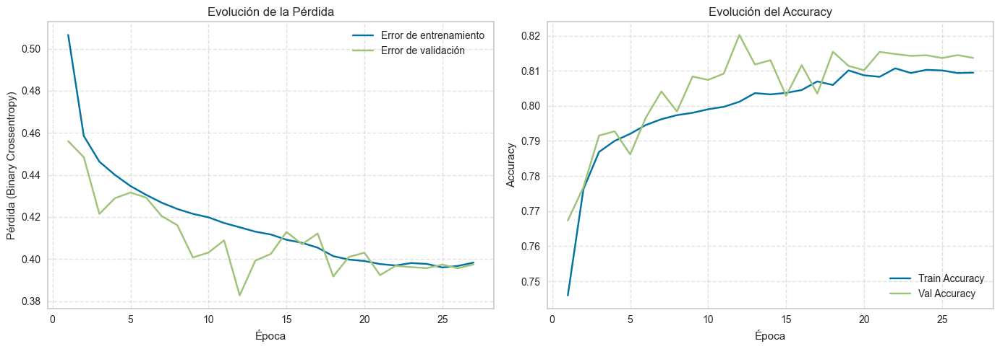

In [202]:
nn_optuna._graficar_evolucion()

En la gráfica de evolución de la pérdida se observa un descenso drástico inicial tanto para el error de entrenamiento como para el error de validación, seguido de una disminución más estable. Esto demuestra que la red neuronal está aprendiendo de forma correcta y que los parámetros obtenidos por Optuna son adecuados. La pequeña diferencia existente entre ambas curvas de error sugiere que no hay un overfitting significativo. Podríamos decir que tenemos un buen fit, ya que la curva de error de validación fluctúa muy cerca de la de entrenamiento, cruzándose en varias ocasiones y convergiendo a valores casi idénticos al final del proceso. Además, podemos observar que, si bien la pérdida sigue disminuyendo levemente, las curvas comienzan a estabilizarse notablemente a partir de la época 20 aproximadamente. El algoritmo finalmente detuvo la ejecución en la época 27 mediante los callbacks de early stopping, al determinar que la mejora ya no era suficiente para continuar.

Por otro lado, a medida que transcurren las épocas, el accuracy tanto de entrenamiento como de validación aumentan de forma consistente, dando a entender que la red consigue mejorar su capacidad de predicción. Aunque la curva de validación presenta más "ruido" o fluctuaciones, se mantiene cercana e incluso por encima de la de entrenamiento en varios puntos. Al no observarse divergencia entre ambas métricas al final del entrenamiento, esto nos indica que nuestro modelo es capaz de generalizar bien.

In [203]:
print("Métricas de la red neuronal optimizada")
reporte_red_optuna = classification_report(y_test,y_pred_nn_optuna, output_dict = True)
df_reporte_red_optuna = pd.DataFrame(reporte_red_optuna).transpose()
df_reporte_red_optuna.style.background_gradient(cmap = 'Blues').format("{:.2f}")

Métricas de la red neuronal optimizada


,precision,recall,f1-score,support
0,0.91,0.88,0.89,22064.00
1,0.62,0.71,0.67,6375.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.77,0.79,0.78,28439.00
weighted avg,0.85,0.84,0.84,28439.00


Podemos observar en nuestras métricas que tenemos un f1-score de 0.67 para la clase positiva, similar a los que obtuvimos previamente, con la gran diferencia que el valor obtenido tenía en cuenta un alto recall y una baja precisión. Al optimizar nuestra red neuronal utilizando el f1-score, logramos nuestro objetivo de balancear la precisión y el recall, haciendo a nuestro modelo mucho más fiable ya que posee un 10% menos de falsos positivos.

A su vez, la clase negativa presenta un aumento significativo en el recall en relación a los modelos de regresión logística, optimizados o no. Esto nos indica que nuestro modelo es mucho mejor a la hora de predecir la clase negativa, de hecho, de los casos clasificados como 'No llueve' solo el 9% son falsos negativos y detecta el 90% de los verdaderos negativos, esto resulta en un f1-score alto para esta clase.

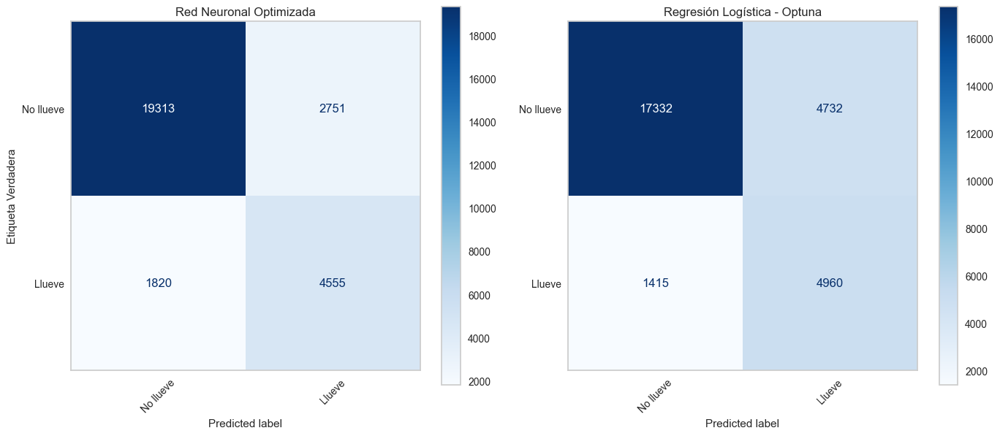

In [204]:
mat_nn_optuna = confusion_matrix(y_true=y_test, y_pred=y_pred_nn_optuna)
mat_logreg_optuna = confusion_matrix(y_true=y_test, y_pred=y_pred_optuna)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6)) 
disp1 = ConfusionMatrixDisplay(mat_nn_optuna, display_labels=['No llueve', 'Llueve'])
disp1.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax1, values_format='d')
ax1.grid(False)
ax1.set_title('Red Neuronal Optimizada')
ax1.set_ylabel('Etiqueta Verdadera')
disp2 = ConfusionMatrixDisplay(mat_logreg_optuna, display_labels=['No llueve', 'Llueve'])
disp2.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax2, values_format='d') 
ax2.grid(False)
ax2.set_title('Regresión Logística - Optuna')
ax2.set_ylabel('')
ax2.tick_params(axis='y', labelleft=True)
plt.tight_layout()
plt.show()

Las matrices de confusión reflejan claramente lo visualizado en las métricas. A comparación de nuestro mejor modelo previo que contemplaba el recall de la clase positiva, observamos una mejoría significativa en la precisión de nuestro modelo de redes neuronales sin sacrificar demasiado el recall.

## SHAP

### Analisis Global

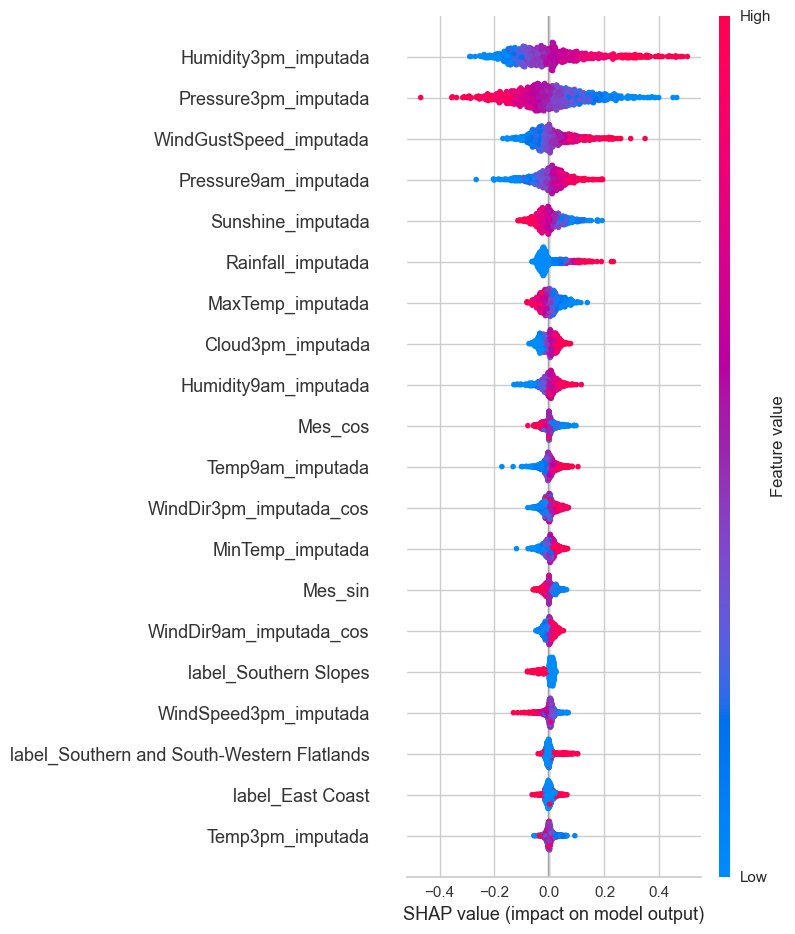

In [205]:
fondo = X_train.sample(5000, random_state=42).to_numpy()
X_test_numpy = X_test.to_numpy()
X_test_muestra = X_test_numpy[:1000]
explainer = shap.DeepExplainer(nn_optuna.model_, fondo)
shap_values = explainer.shap_values(X_test_muestra, check_additivity=False)
if isinstance(shap_values, list):
    shap_values = shap_values[0]

shap_values_limpios = np.squeeze(np.array(shap_values))
shap.summary_plot(shap_values_limpios,
                  X_test_muestra,
                  feature_names=X_train.columns)

Podemos observar en este gráfico que se respeta una jerarquía de features similar a la observada en regresión logística.

La mayor diferencia encontrada es que el modelo de red neuronal prioriza la humedad sobre la presión. Esto puede deberse a que el modelo de red neuronal captura interacciones complejas (no lineales) entre features y eso le permitió determinar que la humedad prima sobre la presión en relación al fenómeno observado. 

A diferencia de los valores SHAP observados en regresión logística, que van de -4 a 6, los del modelo de red neuronal van de -0.4 a 0.4. 

Interpretamos que este cambio de escala se debe a que a la hora de realizar una predicción, la regresión logística utiliza los pesos calculados para cada feature, multiplicado por los valores de la observación, sumados o restados a un valor base o intercepto. Si extrapolamos este concepto, la magnitud del valor SHAP de cada feature está dada por el peso de la variable multiplicado por el valor de la observación, lo que nos lleva a que las contribuciones de las features varíen entre -4 y 6.
La red neuronal, en cambio, utiliza valores entre -0.4 y 0.4 porque estamos observando la contribución de cada feature sobre la probabilidad de predicción de una clase u otra. Entendemos que esto es así ya que la capa de salida de nuestra red neuronal utiliza una función sigmoidea, lo que nos permite modelar la probabilidad de clases.

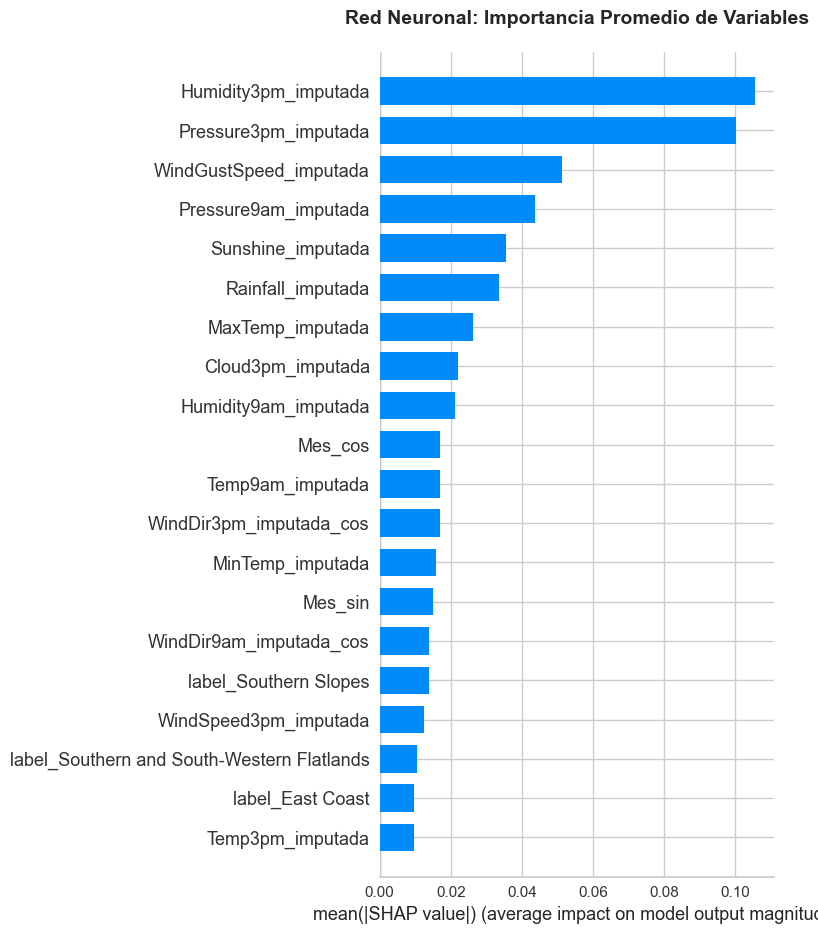

In [206]:
plt.figure(figsize=(12, 8))
shap.summary_plot(
    shap_values_limpios,
    X_test_muestra,
    feature_names=X_train.columns,
    plot_type="bar",
    show=False
)
plt.title('Red Neuronal: Importancia Promedio de Variables',
          fontsize=14, pad=20, fontweight='bold')
plt.tight_layout()
plt.show()

Este gráfico muestra el valor absoluto promedio de la contribución de cada feature a la predicción de clases. Podemos observar que respeta la misma jerarquía que el gráfico observado previamente. 

### Analisis Local

In [207]:
y_pred_red = nn_optuna.predict(X_test)
indices_positivos = np.where(y_pred_red == 1)[0]
indices_negativos = np.where(y_pred_red == 0)[0]
ejemplo_positivo_idx = indices_positivos[5] if len(indices_positivos) > 5 else indices_positivos[0]
ejemplo_negativo_idx = indices_negativos[5] if len(indices_negativos) > 5 else indices_negativos[0]

print(f"\n Casos seleccionados:")
print(f"   -Predicción POSITIVA (Llueve): Índice {ejemplo_positivo_idx}")
print(f"   -Predicción NEGATIVA (No Llueve): Índice {ejemplo_negativo_idx}")


 Casos seleccionados:
   -Predicción POSITIVA (Llueve): Índice 32
   -Predicción NEGATIVA (No Llueve): Índice 7


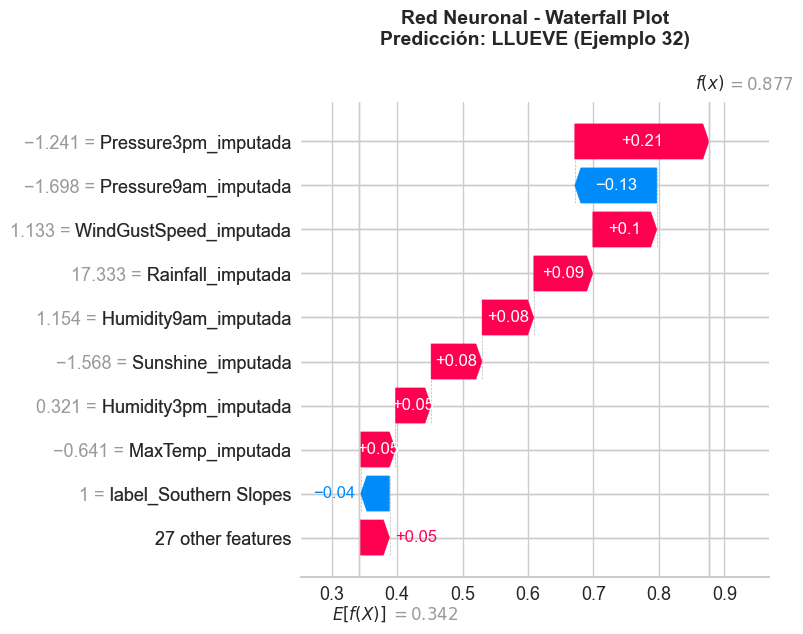

In [208]:
# Convertir el expected_value de TensorFlow a float de Python
base_value = float(explainer.expected_value)
shap_explanation_pos = shap.Explanation(
    values=shap_values_limpios[ejemplo_positivo_idx],
    base_values=base_value,
    data=X_test_muestra[ejemplo_positivo_idx],
    feature_names=X_train.columns
)

plt.figure(figsize=(10, 8))
shap.plots.waterfall(shap_explanation_pos, show=False)
plt.title(f'Red Neuronal - Waterfall Plot\nPredicción: LLUEVE (Ejemplo {ejemplo_positivo_idx})', fontsize=14, pad=20, fontweight='bold')
plt.tight_layout()
plt.show()


Podemos observar que las features predictoras en que presentan la mayor contribución a la predicción son 'Pressure3pm' para la clase positiva, 'Pressure9am' ejerce una fuerza negativa considerable y vemos una seguidilla de variables predictoras que empujan la predicción hacia 'Llueve'. El valor resultante es 0.84 lo que se traduce a un 84% de probabilidades de que llueva. En este caso, como estamos modelando la probabilidad de las clases, dependemos del valor del umbral calculado en nuestra función fit para determinar si efectivamente la predicción es 'Llueve' o 'No llueve'.

In [227]:
print(f"El mejor umbral encontrado es: {nn_optuna.best_threshold_}")

El mejor umbral encontrado es: 0.5737391710281372


A partir de este valor umbral, como el valor SHAP obtenido es mayor que 0.57 nuestro modelo hará la predicción de la clase positiva "Llueve". Si el valor SHAP obtenido fuese menor que 0.57 el modelo hará la predicción de la clase negativa "No llueve".  

<Figure size 1600x400 with 0 Axes>

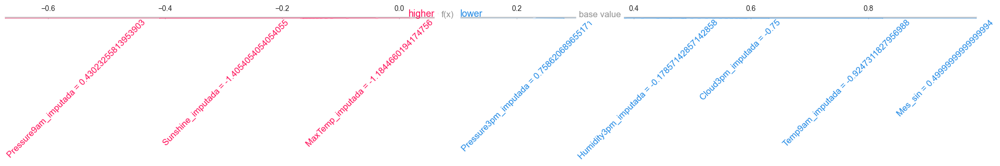

In [229]:
# Convertir expected_value a float
base_value = float(explainer.expected_value)

plt.figure(figsize=(16, 4))
shap.force_plot(
    base_value=base_value,  # Usar el valor convertido
    shap_values=shap_values_limpios[ejemplo_negativo_idx],
    features=X_test_muestra[ejemplo_negativo_idx],
    feature_names=X_train.columns,
    matplotlib=True,
    show=False,
    text_rotation=45
)
plt.tight_layout()
plt.show()

En esta observación, a diferencia de la anterior, podemos ver que ambas fuerzas, positivas y negativas, convergen en un valor muy cercano a 0.2 lo que se traduce a una predicción de 'No llueve'. Observamos que las variables que más contribuyen a la predicción en magnitud son 'Sunshine' y 'Max_temp' para las fuerzas positivas y 'Pressure3pm' y 'Humidity3pm' para las negativas.

En más detalle:

- 'Pressure3pm' debe presentar un valor alto para empujar la prediccion a 'No llueve' (Presión atmosférica alta no es sinónimo de lluvia)
- 'Humidity3pm' debe presentar un valor bajo para empujar a la predicción a 'No llueve' (Humedad baja se corresponde con clima seco)
- 'Sunshine' debe presentar un valor bajo para empujar la predicción a 'Llueve' al igual que 'MaxTemp' (Poco resplandor y temperatura baja corresponden a días nublados y lluviosos)

## Comparacion de Modelos

Presentamos una comparación de modelos final antes de realizar la selección de nuestro modelo. Utilizamos el f1-score de la clase positiva para discriminar cual es el modelo con mayor capacidad de generalizar y presentar buenos resultados. Previamente observamos que el modelo de Red Neuronal no solo presenta un mejor f1-score, si no que lo hace a partir de balancear la precisión y el recall, volviendolo un mejor predictor de lluvias que no genera tantas falsas alarmas como los modelos de Regresión Logística. A su vez también se volvió un buen predictor de días sin lluvia, al mejorar el recall de la clase negativa. Es por estos motivos que seleccionamos a nuestro modelo de Red Neuronal como el mejor de los explorados hasta el momento.

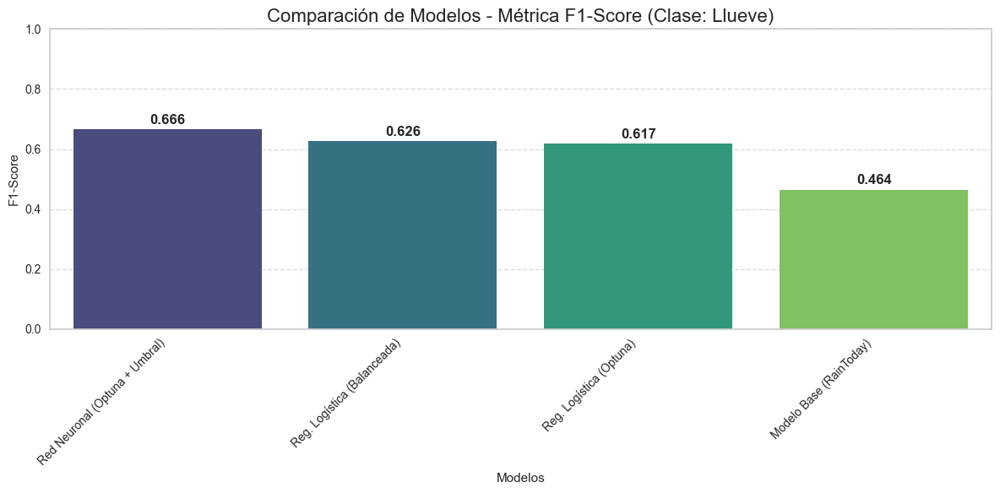

In [230]:
reporte_nn_optuna_std = classification_report(y_test, y_pred_red, output_dict=True)
df_reporte_nn_optuna_std = pd.DataFrame(reporte_nn_optuna_std).transpose() 
resultados_f1 = {
    'Modelo Base (RainToday)': df_reporte_base.loc['1', 'f1-score'],
    'Reg. Logística (Balanceada)': df_reporte_test_1.loc['1', 'f1-score'],
    'Reg. Logística (Optuna)': df_reporte_optuna.loc['1', 'f1-score'],
    'Red Neuronal (Optuna + Umbral)': df_reporte_nn_optuna_std.loc['1', 'f1-score']
}

df_comparacion = pd.DataFrame.from_dict(resultados_f1, orient = 'index', columns = ['F1-Score'])
df_comparacion = df_comparacion.sort_values('F1-Score', ascending = False)
plt.figure(figsize = (12, 6))
ax = sns.barplot(x = df_comparacion.index, y = df_comparacion['F1-Score'], palette = 'viridis')
for i, v in enumerate(df_comparacion['F1-Score']):
    ax.text(i, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontweight='bold')

plt.title('Comparación de Modelos - Métrica F1-Score (Clase: Llueve)', fontsize=16)
plt.ylabel('F1-Score')
plt.xlabel('Modelos')
plt.xticks(rotation = 45, ha = 'right')
plt.ylim(0, 1.0)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.tight_layout()
plt.show()

## Conclusión

El desarrollo de este trabajo práctico se centró en la implementación y evaluación comparativa de diversas estrategias de modelado para la predicción de lluvias. A lo largo del proceso, observamos una evolución incremental en el desempeño donde cada iteración superó a su predecesora en las métricas clave.

Es importante destacar que una mayor complejidad no siempre garantiza automáticamente mejores resultados. Sin embargo, en este caso particular, una arquitectura más compleja sí se tradujo en una mayor precisión. Un hallazgo a tener en cuenta fue el desempeño de las herramientas de AutoML que a pesar de su facilidad de implementación,no lograron superar siquiera a un modelo sencillo (como la regresión logística sin balanceo), cayendo en el sesgo de la clase mayoritaria. Demostrando que, en contextos de desbalanceo severo, la automatización genérica aún no sustituye al diseño y ajuste experto.

En conclusión, la Red Neuronal optimizada se muestra como la mejor alternativa. Si bien conlleva un costo computacional significativamente mayor, la ganancia en capacidad predictiva justifica la inversión, ofreciendo la solución más robusta y fiable para el problema planteado.

## Métodos de Ensamble